# Librerias.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from unidecode import unidecode
from collections import defaultdict


# Miscelánea

## Configuración estilística de las gráficas.

In [3]:
# Ajustar el estilo y los colores globales
plt.style.use('seaborn-v0_8-darkgrid')  # Estilo de fondo con cuadrícula
sns.set_palette("Set2")  # Paleta de colores uniforme para todas las gráficas
sns.set_context("notebook", font_scale=1.1)  # Tamaño de fuente adecuado para notebooks

# Configuración adicional de estilo de gráficos
plt.rcParams.update({
    'axes.titlesize': 16,           # Tamaño de la fuente del título
    'axes.labelsize': 14,           # Tamaño de la fuente de los ejes
    'xtick.labelsize': 12,          # Tamaño de la fuente de las etiquetas del eje x
    'ytick.labelsize': 12,          # Tamaño de la fuente de las etiquetas del eje y
    'legend.fontsize': 12,          # Tamaño de la fuente de la leyenda
    'axes.titleweight': 'bold',     # Peso de la fuente del título
    'axes.labelweight': 'bold',     # Peso de la fuente de las etiquetas de los ejes
    'axes.edgecolor': 'gray',       # Color de los bordes de los ejes
    'axes.grid': True,              # Activar cuadrícula en todos los gráficos
    'grid.alpha': 0.3,              # Transparencia de la cuadrícula
    'grid.color': "gray",           # Color de la cuadrícula
    'legend.frameon': True,         # Fondo de la leyenda visible
    'legend.framealpha': 0.9,       # Transparencia del fondo de la leyenda
    'legend.loc': 'best',           # Ubicación de la leyenda
})

# Configuración de seaborn adicional para coherencia con matplotlib
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})  # Línea de cuadrícula más clara y estilo de puntos



## Funciones entendimiento de datos.

In [4]:
# Funciones para el EDA 

def plot_top_categories(dataset, column, top_n=10):
    """
    Genera un gráfico de barras para las categorías más frecuentes en una columna categórica,
    combinando las categorías menos frecuentes en una categoría "Otros".

    Parámetros:
    dataset (DataFrame): El dataset que contiene la columna.
    column (str): Nombre de la columna categórica.
    top_n (int): Número de categorías principales a mostrar. Las demás se agrupan como "Otros".
    """
    # Calcular las categorías principales y la suma de las demás
    top_categories = dataset[column].value_counts().nlargest(top_n)
    other = dataset[column].value_counts()[top_n:].sum()  # Sumar las categorías restantes
    top_categories["Otros"] = other  # Agregar "Otros" al final
    
    # Crear el gráfico de barras
    plt.figure(figsize=(8, 6))
    sns.barplot(x=top_categories.values, y=top_categories.index)
    plt.xlabel('Frecuencia')
    plt.ylabel(column)
    plt.title(f'Distribución de las principales categorías en {column}')
    plt.show()
    

def plot_numeric_distributions(dataset):
    """
    Genera histogramas para cada variable numérica en el dataset.

    Parámetros:
    dataset (DataFrame): El dataset a analizar.

    """
    # Seleccionar columnas numéricas
    numeric_columns = dataset.select_dtypes(include=['number']).columns
    num_columns = len(numeric_columns)

    # Calcular el número de filas y columnas necesarias para los subgráficos
    num_rows = int(np.ceil(num_columns / 3))

    # Crear subplots para los histogramas
    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 5 * num_rows))
    axes = axes.flatten()

    # Generar el histograma para cada columna numérica
    for i, column in enumerate(numeric_columns):
        dataset[column].hist(ax=axes[i], bins=20)
        axes[i].set_title(column)
        axes[i].set_xlabel('Valor')
        axes[i].set_ylabel('Frecuencia')

    # Eliminar subplots vacíos
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    # Ajustar el espaciado entre los subplots
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.suptitle("Distribución de variables numéricas", fontsize=16)
    plt.show()
    

def plot_correlation_matrix(dataset):
    """
    Genera una matriz de correlación para las columnas numéricas del dataset.

    Parámetros:
    dataset (DataFrame): El dataset a analizar.

    """
    # Seleccionar solo las columnas numéricas
    numeric_data = dataset.select_dtypes(include=['number'])

    plt.figure(figsize=(15, 12))  # Ajusta el tamaño para que sea más grande
    sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', fmt=".2f", square=True, annot_kws={"size": 6})
    plt.title("Matriz de correlación ajustada")
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(fontsize=8)
    plt.show()

def plot_boxplots_and_detect_outliers(dataset):
    """
    Genera un boxplot para cada variable numérica en el dataset e imprime los datos atípicos.

    Parámetros:
    dataset (DataFrame): El dataset que contiene las variables numéricas a analizar.

    Retorna:
    outliers_dict (dict): Un diccionario que contiene los valores atípicos por columna.
    """
    # Seleccionar solo las columnas numéricas
    numeric_columns = dataset.select_dtypes(include=['number']).columns
    outliers_dict = {}

    # Crear un gráfico boxplot para cada variable numérica
    plt.figure(figsize=(15, 5 * len(numeric_columns)))
    for i, column in enumerate(numeric_columns, 1):
        plt.subplot(len(numeric_columns), 1, i)
        sns.boxplot(x=dataset[column])
        plt.title(f'Boxplot de {column}')
        
        # Calcular el rango intercuartílico (IQR) para detectar outliers
        Q1 = dataset[column].quantile(0.25)
        Q3 = dataset[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Identificar valores atípicos
        outliers = dataset[(dataset[column] < lower_bound) | (dataset[column] > upper_bound)][column]
        outliers_dict[column] = outliers.values
        
        # Mostrar la cantidad de datos atípicos
        print(f"{column} - Datos atípicos detectados: {len(outliers)}")
        if len(outliers) > 0:
            print(f"Valores atípicos: {outliers.values}\n")

    # Ajustar el espaciado entre los subplots
    plt.tight_layout()
    plt.show()

    return outliers_dict


## Funciones para el análisis de cálidad.

In [5]:
def check_completeness(dataset):
    """
    Calcula el porcentaje de valores faltantes en cada columna y genera un gráfico de barras.

    Parámetros:
    dataset (DataFrame): El dataset a analizar.

    Retorna:
    missing_data (DataFrame): Un DataFrame con el número y porcentaje de valores faltantes por columna.
    """
    # Calcular valores faltantes
    missing_values = dataset.isnull().sum()
    missing_percentage = (missing_values / len(dataset)) * 100
    missing_data = pd.DataFrame({'Valores faltantes': missing_values, 'Porcentaje (%)': missing_percentage})
    
    # Filtrar columnas con valores faltantes
    missing_data = missing_data[missing_data['Valores faltantes'] > 0].sort_values(by='Porcentaje (%)', ascending=False)
    
    # Mostrar tabla de valores faltantes
    print("Completitud: Valores Faltantes")
    print(missing_data)

    # Graficar los valores faltantes
    plt.figure(figsize=(10, 6))
    missing_data['Porcentaje (%)'].plot(kind='bar')
    plt.title("Porcentaje de Valores Faltantes por Columna")
    plt.xlabel("Columnas")
    plt.ylabel("Porcentaje de Valores Faltantes (%)")
    plt.xticks(rotation=45, ha='right')
    plt.show()

    return missing_data

def check_uniqueness(dataset):
    """
    Detecta duplicados en el dataset, muestra el número y porcentaje de registros duplicados
    y devuelve los registros duplicados para su inspección.

    Parámetros:
    dataset (DataFrame): El dataset a analizar.

    Retorna:
    duplicate_info (dict): Diccionario con el número y porcentaje de duplicados, y los registros duplicados.
    """
    # Detección de duplicados
    duplicate_count = dataset.duplicated().sum()
    duplicate_percentage = (duplicate_count / len(dataset)) * 100
    duplicates = dataset[dataset.duplicated(keep=False)]  # Mantiene todas las filas duplicadas
    
    # Almacenar la información de duplicados
    duplicate_info = {
        'Número de duplicados': duplicate_count,
        'Porcentaje de duplicados (%)': duplicate_percentage,
        'Registros duplicados': duplicates
    }
    
    # Mostrar resultados
    print("Unicidad: Detección de Duplicados")
    print(f"Número de duplicados: {duplicate_count}")
    print(f"Porcentaje de duplicados: {duplicate_percentage:.2f}%")
    
    if duplicate_count > 0:
        print("\nRegistros duplicados (primeras 5 filas):")
        print(duplicates.head())  # Muestra solo las primeras 5 filas de duplicados para evitar imprimir demasiado
    
    return duplicate_info


def check_consistency(dataset, expected_dtypes=None):
    """
    Verifica si los tipos de datos de cada columna en el dataset coinciden con los tipos esperados.

    Parámetros:
    dataset (DataFrame): El dataset a analizar.
    expected_dtypes (dict): Opcional. Diccionario con los tipos de datos esperados para cada columna.
                            Ejemplo: {'FECHA_NACM': 'datetime64[ns]', 'SEXO': 'object'}

    Retorna:
    inconsistencies (dict): Diccionario con inconsistencias encontradas en tipos de datos.
    """
    inconsistencies = {}

    # Si no se proporcionan tipos esperados, detectarlos automáticamente en función del contenido
    if expected_dtypes is None:
        expected_dtypes = {}
        for col in dataset.columns:
            # Detectar si el contenido sugiere un tipo de dato específico
            if pd.api.types.is_datetime64_any_dtype(dataset[col]):
                expected_dtypes[col] = 'datetime64[ns]'
            elif pd.api.types.is_numeric_dtype(dataset[col]):
                expected_dtypes[col] = 'float64' if dataset[col].dtype == 'float' else 'int64'
            elif pd.api.types.is_categorical_dtype(dataset[col]):
                expected_dtypes[col] = 'category'
            else:
                expected_dtypes[col] = 'object'

    # Comparar los tipos de datos actuales con los esperados
    for col, expected_type in expected_dtypes.items():
        actual_type = dataset[col].dtype
        if actual_type != expected_type:
            inconsistencies[col] = {
                'Tipo actual': actual_type,
                'Tipo esperado': expected_type
            }
            print(f"Inconsistencia en '{col}': Tipo actual - {actual_type}, Tipo esperado - {expected_type}")
    
    if not inconsistencies:
        print("Todos los tipos de datos son consistentes con los esperados.")
    
    return inconsistencies

def check_validity_auto(dataset):
    """
    Verifica la validez de los datos comparando los valores con rangos automáticos para columnas numéricas
    y categorías válidas detectadas automáticamente para columnas categóricas.

    Parámetros:
    dataset (DataFrame): El dataset a analizar.

    Retorna:
    validity_issues (dict): Diccionario con los valores fuera de rango o no válidos para cada variable.
    """
    validity_issues = {}
    
    # Verificación automática de variables numéricas
    numeric_columns = dataset.select_dtypes(include=['number']).columns
    for col in numeric_columns:
        Q1 = dataset[col].quantile(0.25)
        Q3 = dataset[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Detectar valores fuera de rango
        out_of_range = dataset[(dataset[col] < lower_bound) | (dataset[col] > upper_bound)][col]
        if not out_of_range.empty:
            validity_issues[col] = {
                'Valores fuera de rango': out_of_range,
                'Rango detectado': (lower_bound, upper_bound)
            }
            print(f"{col} - Valores fuera de rango detectados: {len(out_of_range)}")
            print(f"Rango válido detectado: ({lower_bound}, {upper_bound})")
            print(f"Valores fuera de rango: {out_of_range.unique()}\n")
    
    # Verificación automática de variables categóricas
    categorical_columns = dataset.select_dtypes(include=['object', 'category']).columns
    for col in categorical_columns:
        valid_values = dataset[col].dropna().unique()  # Detecta los valores únicos como válidos
        invalid_values = dataset[~dataset[col].isin(valid_values)][col]
        
        if not invalid_values.empty:
            validity_issues[col] = {
                'Valores no válidos': invalid_values,
                'Valores válidos detectados': valid_values
            }
            print(f"{col} - Valores no válidos detectados: {len(invalid_values)}")
            print(f"Valores válidos detectados: {valid_values}")
            print(f"Valores no válidos: {invalid_values.unique()}\n")
    
    return validity_issues

# Cargar datos. 

In [5]:
# Cargar datos de nacimientos
nac2017_data = pd.read_csv('./data/nac2017.csv', encoding='latin1')
nac2018_data = pd.read_csv('./data/nac2018.csv', encoding='latin1')
nac2021_data = pd.read_csv('./data/nac2021.csv', encoding='latin1')
nac2022_data = pd.read_csv('./data/nac2022.csv', encoding='latin1')

# Cargar la tabla de referencia (asegúrate de reemplazar 'ruta/tabla_referencia.csv' con la ruta correcta)
ciudades_cod = pd.read_csv('./data/ciudades.csv', delimiter=';')

# Cargar datos de temperatura, presión y humedad
temp_data_df = pd.read_csv("./data/temp_data.csv")      # Dataset de temperatura
pres_data_df = pd.read_csv("./data/pres_data.csv")      # Dataset de presión
hum_data_df = pd.read_csv("./data/hum_data.csv")        # Dataset de humedad

# Cargar datos de hospitales
hospitales_df = pd.read_csv("./data/servsal_dpto.csv", encoding='utf-8-sig')
instituciones_df = pd.read_csv("./data/instituciones_de_salud_en_colombia.csv", encoding='utf-8-sig')

C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\3546376632.py:5: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  nac2022_data = pd.read_csv('./data/nac2022.csv', encoding='latin1')


In [6]:
resHosp = pd.read_csv("./data/resps.csv", encoding='utf-8-sig')

C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\58514961.py:1: DtypeWarning: Columns (0,2) have mixed types. Specify dtype option on import or set low_memory=False.
  resHosp = pd.read_csv("./data/resps.csv", encoding='utf-8-sig')



### Descripción de las Columnas
Las principales variables contenidas en este dataset y sus interpretaciones se describen a continuación:

1. **Localización geográfica**:
   - `COD_DPTO`: Código del departamento donde ocurrió el nacimiento.
   - `COD_MUNIC`: Código del municipio de nacimiento.
   - `AREA_RES`: Área de residencia (urbana o rural) del neonato.

2. **Características del nacimiento**:
   - `AREANAC`: Área de ocurrencia del nacimiento (urbana o rural).
   - `SIT_PARTO`: Lugar donde se llevó a cabo el parto.
   - `OTRO_SIT`: Opción adicional para especificar otros lugares de parto no contemplados en `SIT_PARTO`.
   - `TIPO_PARTO`: Tipo de parto (e.g., natural, cesárea).
   - `MUL_PARTO`: Número de neonatos en el parto (simple o múltiple).
   - `APGAR1` y `APGAR2`: Puntuaciones APGAR en el primer y quinto minuto, indicando la salud del recién nacido.
   - `ATEN_PAR`: Persona o entidad que atendió el parto.
   - `PROFESION`: Profesión del que certifica el nacimiento.

3. **Características del neonato**:
   - `SEXO`: Sexo del neonato.
   - `PESO_NAC`: Peso al nacer del bebé.
   - `TALLA_NAC`: Talla del neonato al momento de nacer.
   - `T_GES`: Edad gestacional en semanas.
   - `T_GES_AGRU_CIE`: Edad gestacional agrupada en categorías según la clasificación CIE.

4. **Información de salud y condiciones perinatales**:
   - `IDHEMOCLAS`: Hemoclasificación del nacido vivo (Clasificación Sanguínea).
   - `Inac2017_dataACTORRH`: Factor RH del neonato.
   - `IDPERTET`: De acuerdo con la cultura, pueblo o rasgos físicos, el nacido vivo es reconocido por sus padres como.
   - `NUMCONSUL`: Número de consultas prenatales recibidas durante el embarazo.

5. **Datos de la madre**:
   - `EDAD_MADRE`: Edad de la madre al momento del nacimiento.
   - `EST_CIVM`: Estado civil de la madre.
   - `NIV_EDUM`: Nivel educativo alcanzado por la madre.
   - `ULTCURMAD`: Último año o grado aprobado por la madre.
   - `FECHA_NACM`: Fecha de nacimiento del anterior hijo nacido vivo.
   - `N_HIJOSV`: Número de hijos vivos al que ha tenido la madre incluyendo el presente.
   - `SEG_SOCIAL`: Cobertura de seguridad social de la madre.
   - `IDCLASADMI`: Clasificación administrativa de salud según el régimen al que pertenece la madre.

6. **Datos del padre**:
   - `EDAD_PADRE`: Edad del padre al momento del nacimiento.
   - `NIV_EDUP`: Nivel educativo alcanzado por el padre.
   - `ULTCURPAD`: Último año o grado aprobado por el padre.

7. **Otras variables**:
   - `ANO` y `MES`: Año y mes del nacimiento.
   - `CODPRES`: Código de prestador de salud.
   - `CODPTORE` y `CODMUNRE`: Departamento y municipio de residencia del recién nacido.

### Notas Adicionales
Este dataset contiene algunos valores nulos en las columnas `OTRO_SIT`, `FECHA_NACM`, `CODPTORE`, `CODMUNRE`, `AREA_RES` y `IDCLASADMI`, los cuales deberán manejarse adecuadamente para asegurar la calidad y consistencia del análisis.

# Entendimiento de datos. 

## Nacimientos año 2017

In [7]:
nac2017_data.shape

(656704, 38)

In [8]:
nac2017_data.head()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
0,8,1,1,1,NaN,2,6,5,2017,1,...,1.0,2,27/09/2004,2,1,1.0,26,4,11,1
1,23,1,1,1,NaN,1,5,5,2017,1,...,2.0,1,NaN,1,2,2.0,32,2,5,1
2,11,1,1,1,NaN,1,6,5,2017,1,...,1.0,2,18/09/2013,2,1,1.0,27,3,9,1
3,52,1,1,1,NaN,2,5,4,2017,1,...,3.0,2,03/07/2000,2,2,2.0,26,2,5,1
4,63,1,1,1,NaN,1,7,5,2017,1,...,1.0,1,NaN,1,1,1.0,36,4,11,1


In [9]:
nac2017_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 656704 entries, 0 to 656703
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   COD_DPTO        656704 non-null  int64  
 1   COD_MUNIC       656704 non-null  int64  
 2   AREANAC         656704 non-null  int64  
 3   SIT_PARTO       656704 non-null  int64  
 4   OTRO_SIT        949 non-null     object 
 5   SEXO            656704 non-null  int64  
 6   PESO_NAC        656704 non-null  int64  
 7   TALLA_NAC       656704 non-null  int64  
 8   ANO             656704 non-null  int64  
 9   MES             656704 non-null  int64  
 10  ATEN_PAR        656704 non-null  int64  
 11  T_GES           656704 non-null  int64  
 12  T_GES_AGRU_CIE  656704 non-null  int64  
 13  NUMCONSUL       656704 non-null  int64  
 14  TIPO_PARTO      656704 non-null  int64  
 15  MUL_PARTO       656704 non-null  int64  
 16  APGAR1          656704 non-null  int64  
 17  APGAR2    

In [10]:
nac2017_data.describe()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,CODMUNRE,AREA_RES,N_HIJOSV,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
count,656704.000000,656704.000000,656704.000000,656704.000000,656704.000000,656704.000000,656704.000000,656704.0,656704.000000,656704.000000,...,655437.000000,655508.000000,656704.000000,656704.000000,656704.000000,639202.000000,656704.000000,656704.000000,656704.000000,656704.000000
mean,33.370184,151.646415,1.018992,1.013041,1.487618,5.748814,4.589672,2017.0,6.616829,1.043828,...,234.506043,1.351126,1.893667,2.063118,1.696131,1.655408,58.025043,14.798865,19.205003,1.016883
std,26.598225,253.341825,0.188827,0.139733,0.500130,1.072582,0.573479,0.0,3.423791,0.433671,...,292.594517,0.716393,1.839017,2.029092,0.769390,0.732162,164.265630,29.365526,30.399744,0.241631
min,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2017.0,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,13.000000,1.000000,0.000000,1.000000
25%,11.000000,1.000000,1.000000,1.000000,1.000000,5.000000,4.000000,2017.0,4.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,24.000000,3.000000,5.000000,1.000000
50%,20.000000,1.000000,1.000000,1.000000,1.000000,6.000000,5.000000,2017.0,7.000000,1.000000,...,50.000000,1.000000,2.000000,2.000000,2.000000,2.000000,29.000000,4.000000,9.000000,1.000000
75%,54.000000,265.000000,1.000000,1.000000,2.000000,6.000000,5.000000,2017.0,10.000000,1.000000,...,450.000000,1.000000,2.000000,3.000000,2.000000,2.000000,35.000000,8.000000,11.000000,1.000000
max,99.000000,980.000000,9.000000,9.000000,3.000000,9.000000,9.000000,2017.0,12.000000,9.000000,...,980.000000,9.000000,99.000000,99.000000,9.000000,9.000000,999.000000,99.000000,99.000000,9.000000


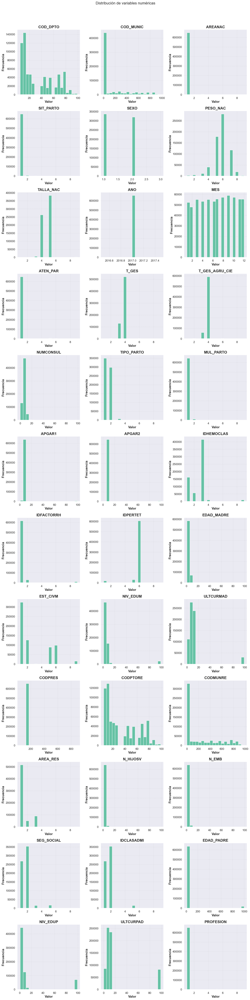

In [11]:
plot_numeric_distributions(nac2017_data)

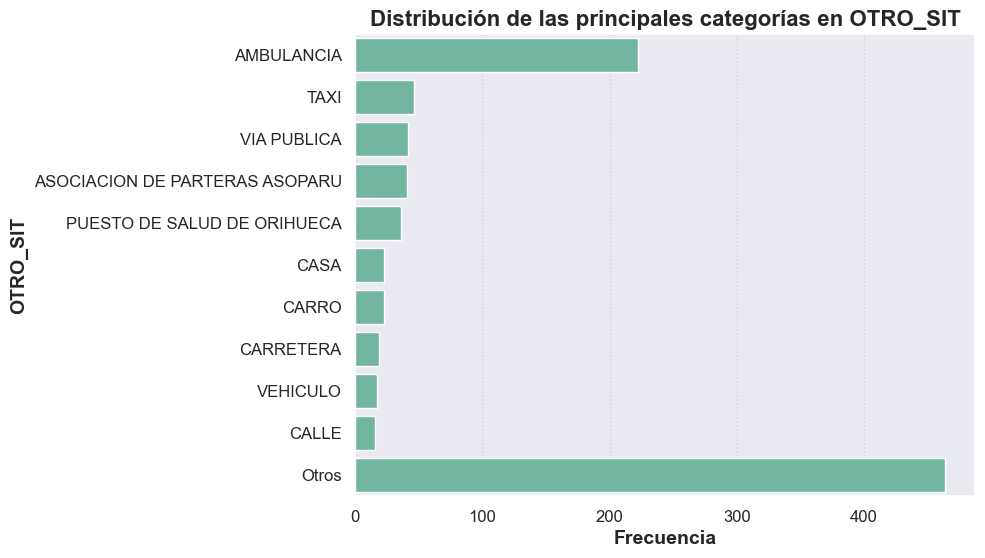

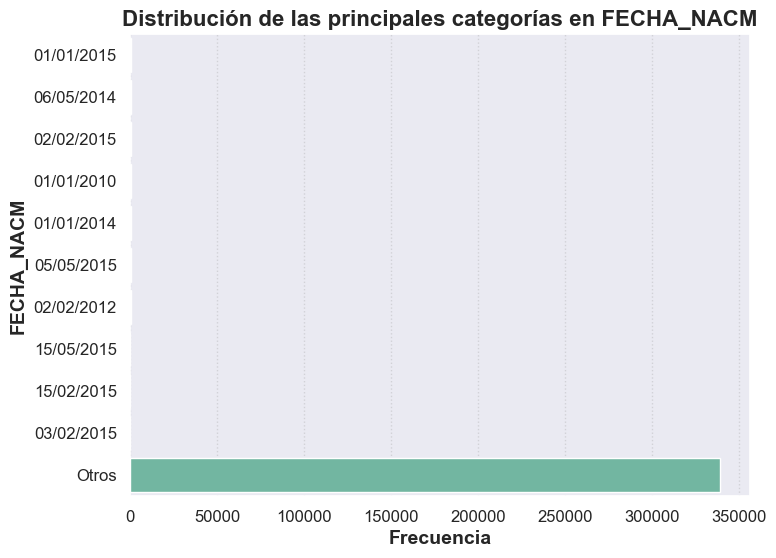

In [12]:
plot_top_categories(nac2017_data, 'OTRO_SIT')
plot_top_categories(nac2017_data, 'FECHA_NACM')

COD_DPTO - Datos atípicos detectados: 0
COD_MUNIC - Datos atípicos detectados: 50640
Valores atípicos: [797 834 758 ... 664 736 664]

AREANAC - Datos atípicos detectados: 7512
Valores atípicos: [3 3 3 ... 3 2 3]

SIT_PARTO - Datos atípicos detectados: 7303
Valores atípicos: [3 2 2 ... 2 2 2]

SEXO - Datos atípicos detectados: 0
PESO_NAC - Datos atípicos detectados: 39444
Valores atípicos: [1 8 2 ... 2 3 8]

TALLA_NAC - Datos atípicos detectados: 2527
Valores atípicos: [1 2 2 ... 9 9 9]

ANO - Datos atípicos detectados: 0
MES - Datos atípicos detectados: 0
ATEN_PAR - Datos atípicos detectados: 7120
Valores atípicos: [5 6 6 ... 2 5 6]

T_GES - Datos atípicos detectados: 135824
Valores atípicos: [3 3 3 ... 3 3 3]

T_GES_AGRU_CIE - Datos atípicos detectados: 65249
Valores atípicos: [2 3 3 ... 3 3 3]

NUMCONSUL - Datos atípicos detectados: 26824
Valores atípicos: [15 15  0 ... 13  0  0]

TIPO_PARTO - Datos atípicos detectados: 175
Valores atípicos: [4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4

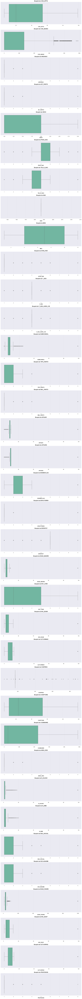

{'COD_DPTO': array([], dtype=int64),
 'COD_MUNIC': array([797, 834, 758, ..., 664, 736, 664], dtype=int64),
 'AREANAC': array([3, 3, 3, ..., 3, 2, 3], dtype=int64),
 'SIT_PARTO': array([3, 2, 2, ..., 2, 2, 2], dtype=int64),
 'SEXO': array([], dtype=int64),
 'PESO_NAC': array([1, 8, 2, ..., 2, 3, 8], dtype=int64),
 'TALLA_NAC': array([1, 2, 2, ..., 9, 9, 9], dtype=int64),
 'ANO': array([], dtype=int64),
 'MES': array([], dtype=int64),
 'ATEN_PAR': array([5, 6, 6, ..., 2, 5, 6], dtype=int64),
 'T_GES': array([3, 3, 3, ..., 3, 3, 3], dtype=int64),
 'T_GES_AGRU_CIE': array([2, 3, 3, ..., 3, 3, 3], dtype=int64),
 'NUMCONSUL': array([15, 15,  0, ..., 13,  0,  0], dtype=int64),
 'TIPO_PARTO': array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 9, 9, 9, 9, 9,
        9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 9, 9, 9, 9, 9, 9, 9,
        9,

In [13]:
plot_boxplots_and_detect_outliers(nac2017_data)

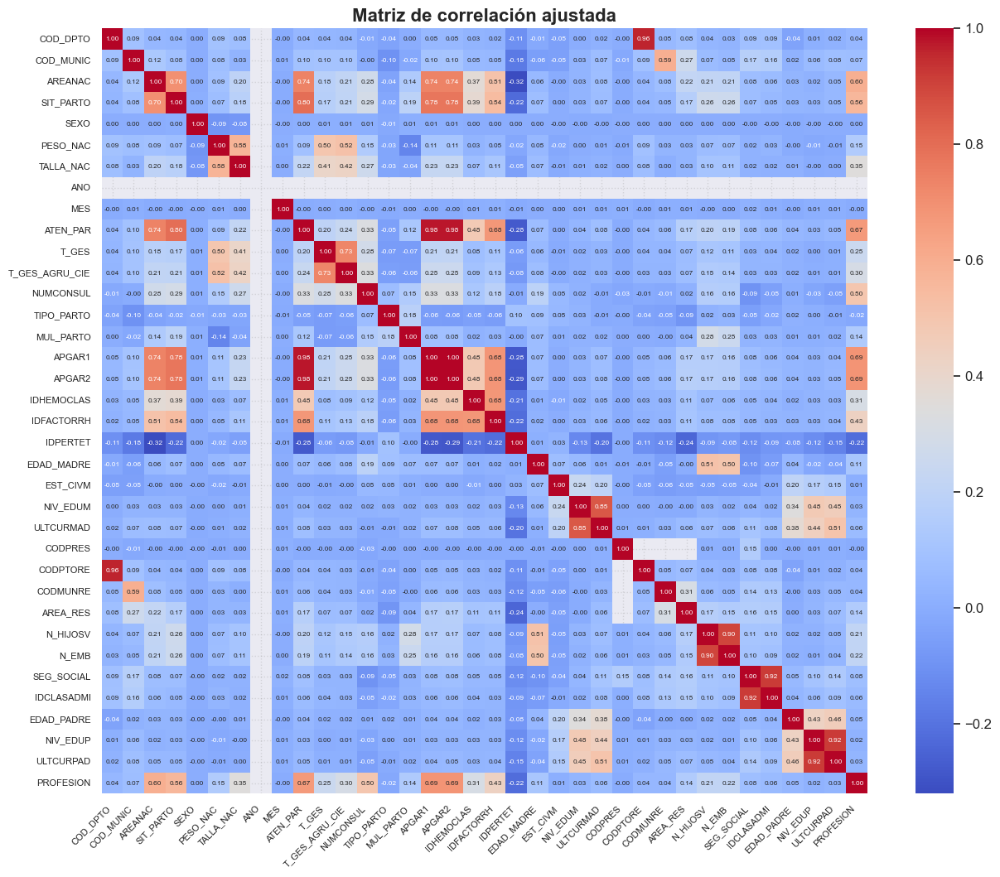

In [14]:
plot_correlation_matrix(nac2017_data)


Análisis de cálidad de los datos.

Completitud: Valores Faltantes
            Valores faltantes  Porcentaje (%)
OTRO_SIT               655755       99.855490
FECHA_NACM             313640       47.759721
IDCLASADMI              17502        2.665128
CODMUNRE                 1267        0.192933
CODPTORE                 1266        0.192781
AREA_RES                 1196        0.182122
CODPRES                     1        0.000152


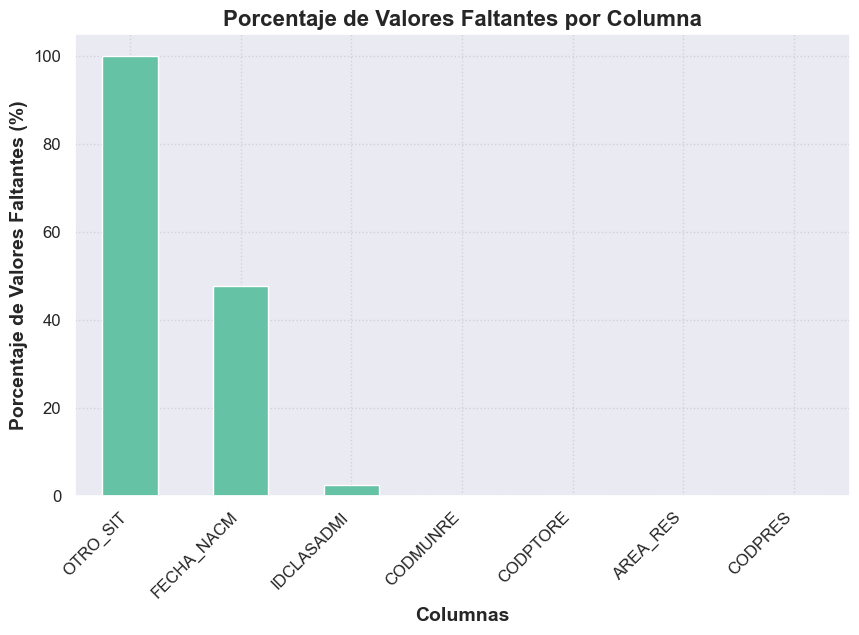

In [15]:
missing_data17 = check_completeness(nac2017_data)

In [16]:
duplicate_info17 = check_uniqueness(nac2017_data)

Unicidad: Detección de Duplicados
Número de duplicados: 2020
Porcentaje de duplicados: 0.31%

Registros duplicados (primeras 5 filas):
     COD_DPTO  COD_MUNIC  AREANAC  SIT_PARTO OTRO_SIT  SEXO  PESO_NAC  \
55          8          1        1          1      NaN     1         5   
59          8          1        1          1      NaN     2         5   
63          8          1        1          1      NaN     1         6   
370         8          1        1          1      NaN     1         5   
815         8          1        1          1      NaN     2         5   

     TALLA_NAC   ANO  MES  ...  AREA_RES  N_HIJOSV  FECHA_NACM  N_EMB  \
55           5  2017    1  ...       1.0         1         NaN      1   
59           4  2017    1  ...       1.0         1         NaN      1   
63           5  2017    1  ...       1.0         1         NaN      1   
370          4  2017    3  ...       1.0         1         NaN      1   
815          5  2017    1  ...       1.0         1         Na

In [17]:
validity_issues17 = check_validity_auto(nac2017_data)

COD_MUNIC - Valores fuera de rango detectados: 50640
Rango válido detectado: (-395.0, 661.0)
Valores fuera de rango: [797 834 758 858 887 837 843 847 785 682 755 698 835 754 688 865 736 892
 759 890 662 708 861 789 838 665 753 810 895 678 686 679 871 718 674 680
 773 874 770 899 832 807 687 672 873 814 821 743 670 872 667 787 689 885
 690 756 744 710 742 815 675 877 696 745 878 893 836 668 713 780 794 757
 673 799 699 883 819 824 875 855 772 790 823 777 870 685 820 671 711 788
 692 854 664 761 683 842 898 720 851 801 828 676 763 760 809 750 717 791
 703 798 707 666 800 681 684 980 960 867 863 663 862 845 771 849 856 792
 869 822 702 693 860 669 816 697 793 786 886 776 701 804 841 839 705 889
 769 894 740 884 774 817 778 888]

AREANAC - Valores fuera de rango detectados: 7512
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [3 2 9]

SIT_PARTO - Valores fuera de rango detectados: 7303
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [3 2 9]

PESO_NAC - Valores fuera d

In [18]:
incosistences17 = check_consistency(nac2017_data)

Todos los tipos de datos son consistentes con los esperados.


C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\604307692.py:92: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(dataset[col]):


## Nacimientos año 2018

In [19]:
nac2018_data.shape

(649115, 38)

In [20]:
nac2018_data.head()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
0,5,1,1,1,NaN,1,7,5,2018,1,...,1.0,2,13/08/2014,2,1,1.0,30,4,11,1
1,11,1,1,1,NaN,1,6,5,2018,1,...,1.0,1,NaN,1,1,1.0,36,9,5,1
2,52,1,1,1,NaN,1,6,5,2018,1,...,1.0,2,15/02/2011,3,2,2.0,27,4,11,1
3,11,1,1,1,NaN,1,6,5,2018,1,...,1.0,1,NaN,2,1,1.0,32,9,5,1
4,50,1,1,1,NaN,1,5,4,2018,1,...,3.0,1,NaN,1,2,2.0,21,4,11,1


In [21]:
nac2018_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 649115 entries, 0 to 649114
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   COD_DPTO        649115 non-null  int64  
 1   COD_MUNIC       649115 non-null  int64  
 2   AREANAC         649115 non-null  int64  
 3   SIT_PARTO       649115 non-null  int64  
 4   OTRO_SIT        1828 non-null    object 
 5   SEXO            649115 non-null  int64  
 6   PESO_NAC        649115 non-null  int64  
 7   TALLA_NAC       649115 non-null  int64  
 8   ANO             649115 non-null  int64  
 9   MES             649115 non-null  int64  
 10  ATEN_PAR        649115 non-null  int64  
 11  T_GES           649115 non-null  int64  
 12  T_GES_AGRU_CIE  649115 non-null  int64  
 13  NUMCONSUL       649115 non-null  int64  
 14  TIPO_PARTO      649115 non-null  int64  
 15  MUL_PARTO       649115 non-null  int64  
 16  APGAR1          649115 non-null  int64  
 17  APGAR2    

In [22]:
nac2018_data.describe()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,CODMUNRE,AREA_RES,N_HIJOSV,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
count,649115.000000,649115.000000,649115.000000,649115.000000,649115.000000,649115.000000,649115.000000,649115.0,649115.000000,649115.000000,...,645024.000000,645128.000000,649115.000000,649115.000000,649115.000000,611937.000000,649115.000000,649115.000000,649115.000000,649115.000000
mean,33.556153,155.288598,1.027009,1.019362,1.487505,5.753511,4.606293,2018.0,6.624797,1.067855,...,238.898125,1.362373,1.896809,2.066732,1.812081,1.665745,52.961193,15.140921,17.802514,1.028433
std,26.517853,255.710369,0.220452,0.156905,0.500066,1.093571,0.647971,0.0,3.447090,0.537715,...,294.366491,0.725760,1.250497,1.417519,0.941423,0.712519,149.128972,29.813059,28.953136,0.319205
min,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2018.0,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,13.000000,1.000000,0.000000,1.000000
25%,11.000000,1.000000,1.000000,1.000000,1.000000,5.000000,4.000000,2018.0,4.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,24.000000,3.000000,5.000000,1.000000
50%,23.000000,1.000000,1.000000,1.000000,1.000000,6.000000,5.000000,2018.0,7.000000,1.000000,...,60.000000,1.000000,2.000000,2.000000,2.000000,2.000000,29.000000,4.000000,9.000000,1.000000
75%,54.000000,266.000000,1.000000,1.000000,2.000000,6.000000,5.000000,2018.0,10.000000,1.000000,...,466.000000,1.000000,2.000000,3.000000,2.000000,2.000000,35.000000,8.000000,11.000000,1.000000
max,99.000000,980.000000,3.000000,3.000000,3.000000,9.000000,9.000000,2018.0,12.000000,6.000000,...,980.000000,9.000000,99.000000,99.000000,9.000000,9.000000,999.000000,99.000000,99.000000,5.000000


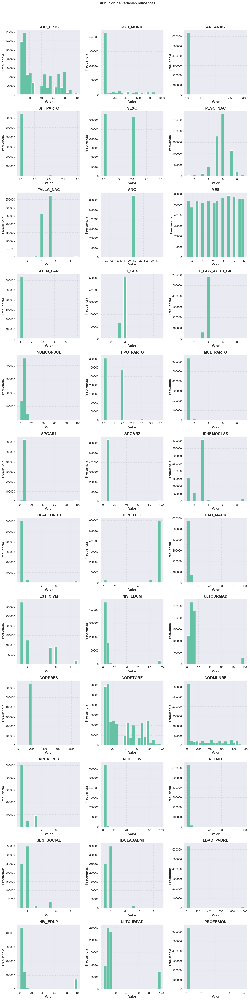

In [23]:
plot_numeric_distributions(nac2018_data)

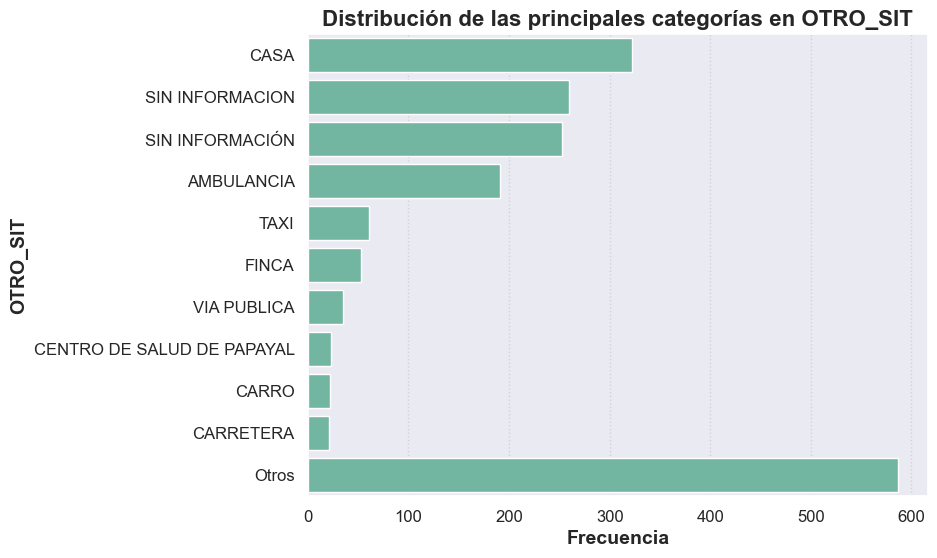

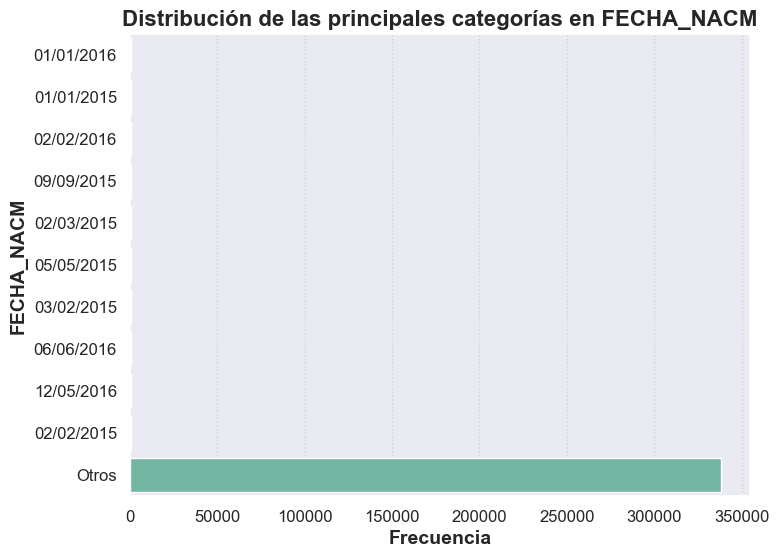

In [24]:
plot_top_categories(nac2018_data, 'OTRO_SIT')
plot_top_categories(nac2018_data, 'FECHA_NACM')

COD_DPTO - Datos atípicos detectados: 0
COD_MUNIC - Datos atípicos detectados: 51142
Valores atípicos: [756 758 821 ... 736 669 834]

AREANAC - Datos atípicos detectados: 10288
Valores atípicos: [3 2 2 ... 3 2 2]

SIT_PARTO - Datos atípicos detectados: 10740
Valores atípicos: [2 2 2 ... 3 2 2]

SEXO - Datos atípicos detectados: 0
PESO_NAC - Datos atípicos detectados: 41404
Valores atípicos: [8 3 1 ... 8 3 8]

TALLA_NAC - Datos atípicos detectados: 5518
Valores atípicos: [9 2 2 ... 9 2 9]

ANO - Datos atípicos detectados: 0
MES - Datos atípicos detectados: 0
ATEN_PAR - Datos atípicos detectados: 10701
Valores atípicos: [5 4 6 ... 6 5 5]

T_GES - Datos atípicos detectados: 139315
Valores atípicos: [3 3 3 ... 3 3 3]

T_GES_AGRU_CIE - Datos atípicos detectados: 68065
Valores atípicos: [3 3 3 ... 3 3 3]

NUMCONSUL - Datos atípicos detectados: 35172
Valores atípicos: [0 0 0 ... 0 0 0]

TIPO_PARTO - Datos atípicos detectados: 203
Valores atípicos: [4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 

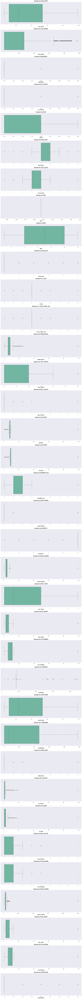

{'COD_DPTO': array([], dtype=int64),
 'COD_MUNIC': array([756, 758, 821, ..., 736, 669, 834], dtype=int64),
 'AREANAC': array([3, 2, 2, ..., 3, 2, 2], dtype=int64),
 'SIT_PARTO': array([2, 2, 2, ..., 3, 2, 2], dtype=int64),
 'SEXO': array([], dtype=int64),
 'PESO_NAC': array([8, 3, 1, ..., 8, 3, 8], dtype=int64),
 'TALLA_NAC': array([9, 2, 2, ..., 9, 2, 9], dtype=int64),
 'ANO': array([], dtype=int64),
 'MES': array([], dtype=int64),
 'ATEN_PAR': array([5, 4, 6, ..., 6, 5, 5], dtype=int64),
 'T_GES': array([3, 3, 3, ..., 3, 3, 3], dtype=int64),
 'T_GES_AGRU_CIE': array([3, 3, 3, ..., 3, 3, 3], dtype=int64),
 'NUMCONSUL': array([0, 0, 0, ..., 0, 0, 0], dtype=int64),
 'TIPO_PARTO': array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4,

In [25]:
plot_boxplots_and_detect_outliers(nac2018_data)

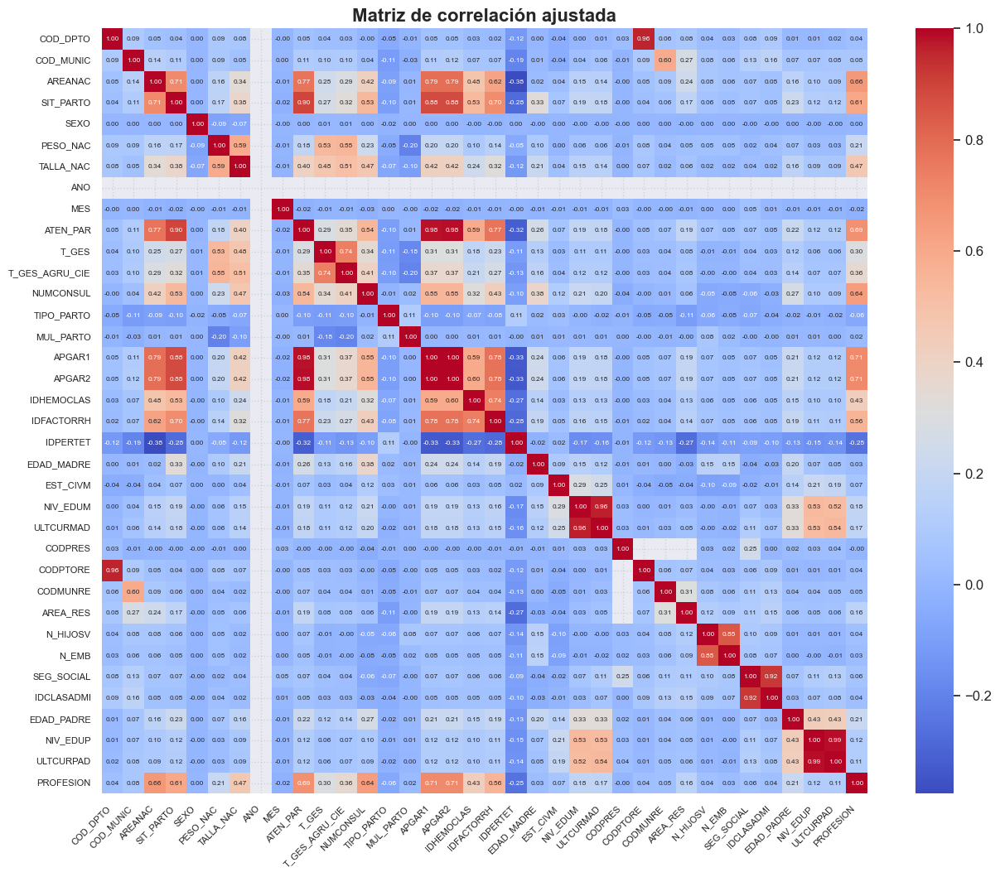

In [26]:
plot_correlation_matrix(nac2018_data)

Análisis de cálidad de los datos.

Completitud: Valores Faltantes
            Valores faltantes  Porcentaje (%)
OTRO_SIT               647287       99.718386
FECHA_NACM             307639       47.393605
IDCLASADMI              37178        5.727491
CODPTORE                 4091        0.630243
CODMUNRE                 4091        0.630243
AREA_RES                 3987        0.614221


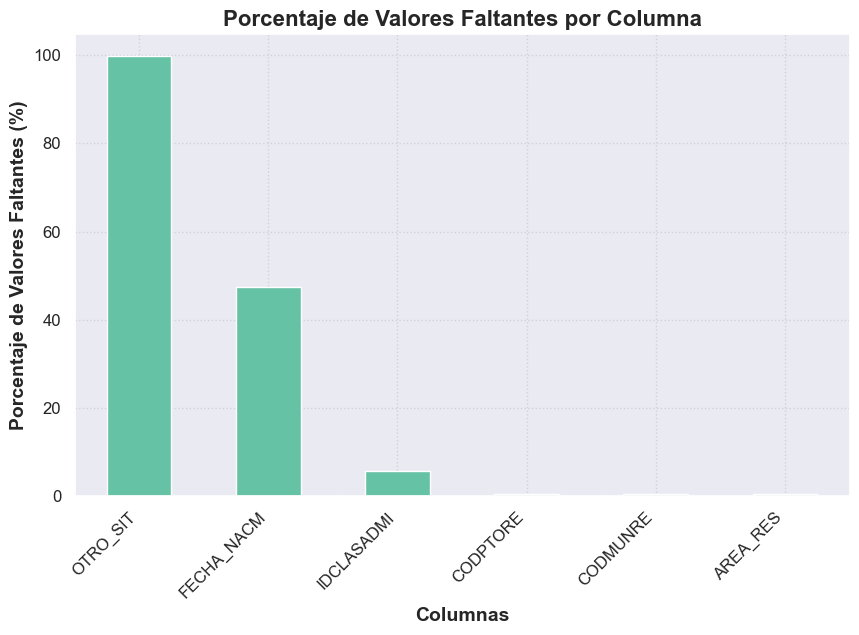

In [27]:
missing_data18 = check_completeness(nac2018_data)

In [28]:
duplicate_info18 = check_uniqueness(nac2018_data)

Unicidad: Detección de Duplicados
Número de duplicados: 1313
Porcentaje de duplicados: 0.20%

Registros duplicados (primeras 5 filas):
      COD_DPTO  COD_MUNIC  AREANAC  SIT_PARTO OTRO_SIT  SEXO  PESO_NAC  \
469          8          1        1          1      NaN     1         6   
479         66          1        1          1      NaN     2         3   
522         54          1        1          1      NaN     1         3   
533          8          1        1          1      NaN     1         6   
1255         5          1        1          1      NaN     1         5   

      TALLA_NAC   ANO  MES  ...  AREA_RES  N_HIJOSV  FECHA_NACM  N_EMB  \
469           5  2018    1  ...       1.0         1         NaN      1   
479           4  2018    1  ...       1.0         5  23/12/2010      4   
522           4  2018    1  ...       1.0         5  09/12/2015      4   
533           5  2018    1  ...       1.0         1         NaN      1   
1255          4  2018    1  ...       1.0         

In [29]:
validity_issues18 = check_validity_auto(nac2018_data)

COD_MUNIC - Valores fuera de rango detectados: 51142
Rango válido detectado: (-396.5, 663.5)
Valores fuera de rango: [756 758 821 887 847 835 708 837 698 834 843 854 675 686 875 777 679 670
 861 895 759 754 707 736 693 710 899 865 807 890 744 753 820 755 683 743
 689 877 665 855 794 790 874 685 687 838 672 860 815 680 856 763 810 828
 713 873 682 893 869 770 863 688 664 836 750 773 720 885 785 814 858 809
 761 699 799 692 780 789 824 819 757 667 787 797 711 673 862 980 823 742
 892 678 791 668 817 867 669 800 674 849 798 718 745 769 676 878 671 788
 822 870 884 701 883 886 872 684 760 804 845 842 717 801 690 960 871 792
 771 776 786 696 740 889 894 681 703 764 772 762 666 697 832 702 793 839
 779 841 816]

AREANAC - Valores fuera de rango detectados: 10288
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [3 2]

SIT_PARTO - Valores fuera de rango detectados: 10740
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [2 3]

PESO_NAC - Valores fuera de rango detectados: 41

In [30]:
incosistences18 = check_consistency(nac2018_data)

Todos los tipos de datos son consistentes con los esperados.


C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\604307692.py:92: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(dataset[col]):


## Nacimientos año 2021

In [31]:
nac2021_data.shape

(616914, 39)

In [32]:
nac2021_data.head()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
0,47,245,1,1,NaN,2,6,5,2021,1,...,3,03/04/2013,3,1,1.0,37,4,11,1.0,1
1,47,245,1,1,NaN,1,5,4,2021,1,...,3,17/01/2009,5,2,2.0,35,9,5,1.0,1
2,47,245,1,1,NaN,1,6,5,2021,2,...,1,NaN,2,2,2.0,27,3,9,1.0,1
3,47,245,1,1,NaN,2,6,4,2021,1,...,2,16/08/2017,2,2,2.0,40,4,11,1.0,1
4,13,1,1,1,NaN,2,6,5,2021,2,...,2,22/05/2014,2,3,5.0,32,9,5,1.0,1


In [33]:
nac2021_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 616914 entries, 0 to 616913
Data columns (total 39 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   COD_DPTO        616914 non-null  int64  
 1   COD_MUNIC       616914 non-null  int64  
 2   AREANAC         616914 non-null  int64  
 3   SIT_PARTO       616914 non-null  int64  
 4   OTRO_SIT        1444 non-null    object 
 5   SEXO            616914 non-null  int64  
 6   PESO_NAC        616914 non-null  int64  
 7   TALLA_NAC       616914 non-null  int64  
 8   ANO             616914 non-null  int64  
 9   MES             616914 non-null  int64  
 10  ATEN_PAR        616914 non-null  int64  
 11  T_GES           616914 non-null  int64  
 12  T_GES_AGRU_CIE  616914 non-null  int64  
 13  NUMCONSUL       616914 non-null  int64  
 14  TIPO_PARTO      616914 non-null  int64  
 15  MUL_PARTO       616914 non-null  int64  
 16  APGAR1          616914 non-null  int64  
 17  APGAR2    

In [34]:
nac2021_data.describe()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
count,616914.000000,616914.000000,616914.000000,616914.000000,616914.000000,616914.000000,616914.000000,616914.0,616914.000000,616914.000000,...,608086.000000,616914.000000,616914.000000,616914.000000,551221.000000,616914.000000,616914.000000,616914.000000,616847.000000,616914.000000
mean,34.704174,172.189263,1.047105,1.029485,1.487908,5.736197,4.611957,2021.0,6.640434,1.108868,...,1.427025,1.974295,2.151569,1.999157,1.677425,37.662870,13.799131,16.591985,1.054184,1.000109
std,26.577299,266.100926,0.290024,0.182467,0.500026,1.115809,0.720720,0.0,3.413818,0.666225,...,0.772575,1.578043,1.700261,1.147784,0.662156,86.917286,28.100663,27.273895,0.438998,0.010421
min,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2021.0,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,13.000000,1.000000,0.000000,1.000000,1.000000
25%,11.000000,1.000000,1.000000,1.000000,1.000000,5.000000,4.000000,2021.0,4.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,24.000000,3.000000,5.000000,1.000000,1.000000
50%,23.000000,1.000000,1.000000,1.000000,1.000000,6.000000,5.000000,2021.0,7.000000,1.000000,...,1.000000,2.000000,2.000000,2.000000,2.000000,29.000000,4.000000,9.000000,1.000000,1.000000
75%,54.000000,290.000000,1.000000,1.000000,2.000000,6.000000,5.000000,2021.0,10.000000,1.000000,...,2.000000,2.000000,3.000000,2.000000,2.000000,35.000000,8.000000,11.000000,1.000000,1.000000
max,99.000000,980.000000,3.000000,3.000000,3.000000,9.000000,9.000000,2021.0,12.000000,6.000000,...,9.000000,99.000000,99.000000,9.000000,5.000000,999.000000,99.000000,99.000000,5.000000,2.000000


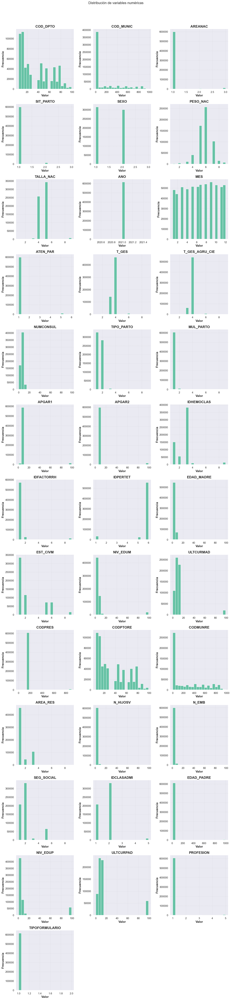

In [35]:
plot_numeric_distributions(nac2021_data)

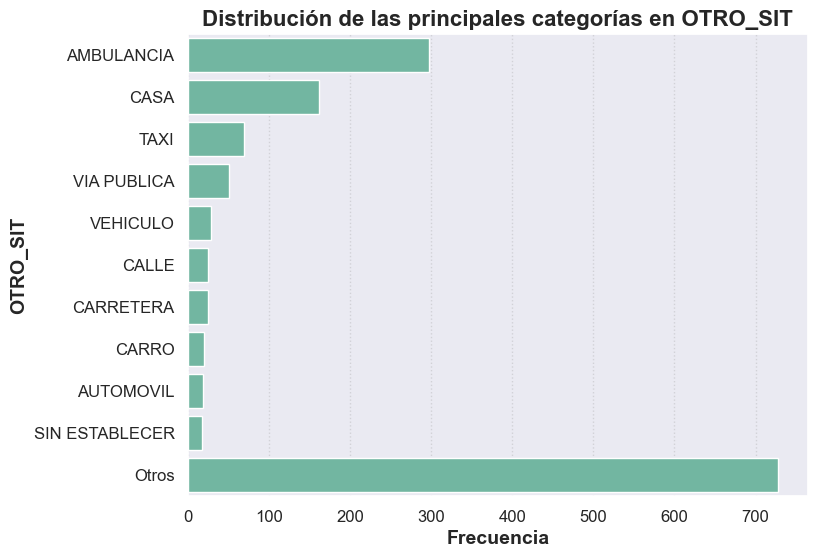

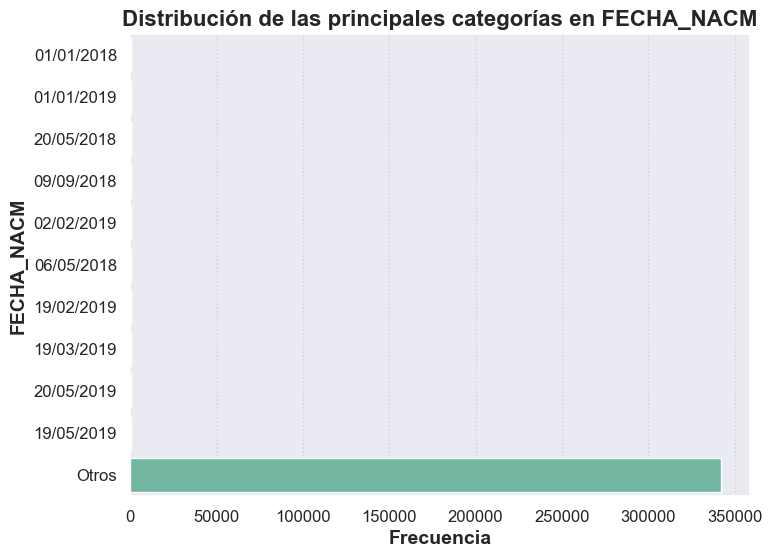

In [36]:
plot_top_categories(nac2021_data, 'OTRO_SIT')
plot_top_categories(nac2021_data, 'FECHA_NACM')

COD_DPTO - Datos atípicos detectados: 0
COD_MUNIC - Datos atípicos detectados: 46180
Valores atípicos: [758 758 758 ... 800 787 787]

AREANAC - Datos atípicos detectados: 16960
Valores atípicos: [2 2 3 ... 3 3 3]

SIT_PARTO - Datos atípicos detectados: 16747
Valores atípicos: [2 2 2 ... 3 3 2]

SEXO - Datos atípicos detectados: 0
PESO_NAC - Datos atípicos detectados: 41526
Valores atípicos: [8 8 3 ... 9 9 9]

TALLA_NAC - Datos atípicos detectados: 8356
Valores atípicos: [9 9 9 ... 9 9 9]

ANO - Datos atípicos detectados: 0
MES - Datos atípicos detectados: 0
ATEN_PAR - Datos atípicos detectados: 16861
Valores atípicos: [5 5 5 ... 5 5 5]

T_GES - Datos atípicos detectados: 153956
Valores atípicos: [3 3 3 ... 6 6 6]

T_GES_AGRU_CIE - Datos atípicos detectados: 74054
Valores atípicos: [3 3 3 ... 6 6 6]

NUMCONSUL - Datos atípicos detectados: 5289
Valores atípicos: [99 15 99 ... 99 99 99]

TIPO_PARTO - Datos atípicos detectados: 201
Valores atípicos: [4 4 4 4 4 9 9 9 9 9 9 9 9 9 4 4 4 4 4 4

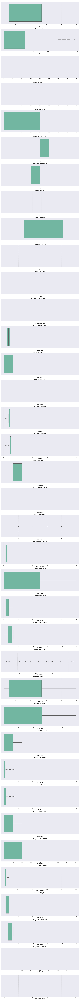

{'COD_DPTO': array([], dtype=int64),
 'COD_MUNIC': array([758, 758, 758, ..., 800, 787, 787], dtype=int64),
 'AREANAC': array([2, 2, 3, ..., 3, 3, 3], dtype=int64),
 'SIT_PARTO': array([2, 2, 2, ..., 3, 3, 2], dtype=int64),
 'SEXO': array([], dtype=int64),
 'PESO_NAC': array([8, 8, 3, ..., 9, 9, 9], dtype=int64),
 'TALLA_NAC': array([9, 9, 9, ..., 9, 9, 9], dtype=int64),
 'ANO': array([], dtype=int64),
 'MES': array([], dtype=int64),
 'ATEN_PAR': array([5, 5, 5, ..., 5, 5, 5], dtype=int64),
 'T_GES': array([3, 3, 3, ..., 6, 6, 6], dtype=int64),
 'T_GES_AGRU_CIE': array([3, 3, 3, ..., 6, 6, 6], dtype=int64),
 'NUMCONSUL': array([99, 15, 99, ..., 99, 99, 99], dtype=int64),
 'TIPO_PARTO': array([4, 4, 4, 4, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4, 4, 4, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
        4,

In [37]:
plot_boxplots_and_detect_outliers(nac2021_data)

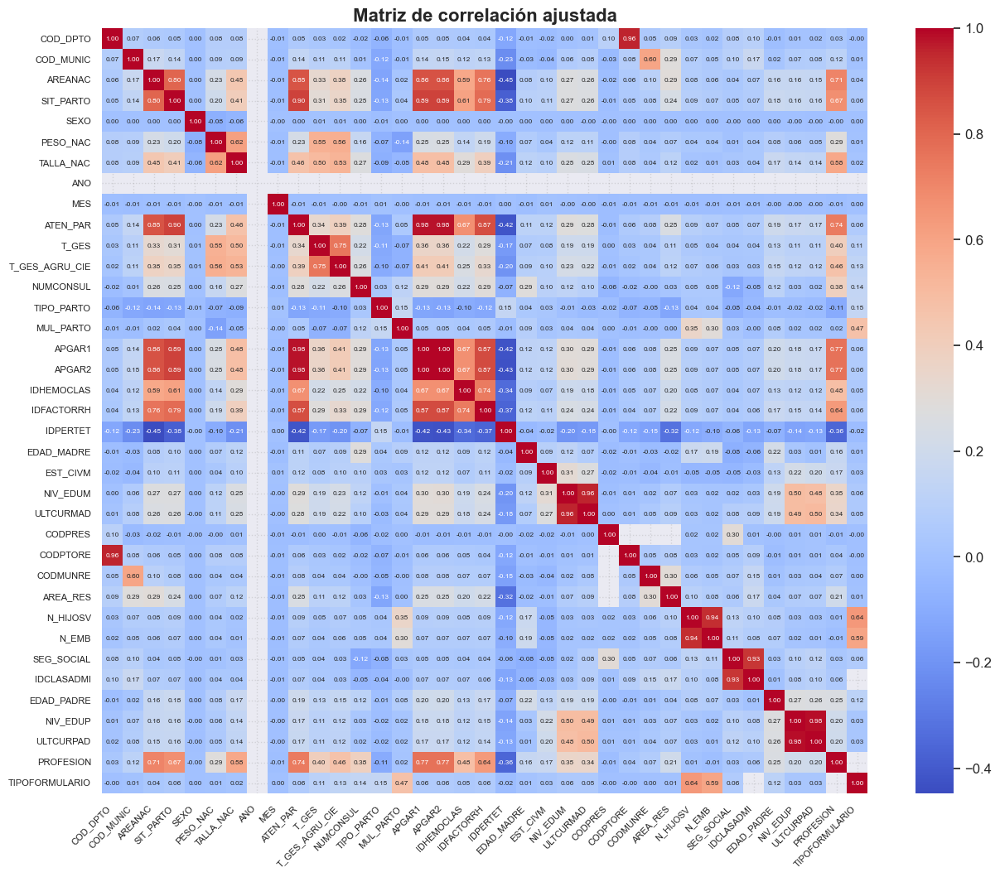

In [38]:
plot_correlation_matrix(nac2021_data)

Análisis de calidad de los datos. 

Completitud: Valores Faltantes
            Valores faltantes  Porcentaje (%)
OTRO_SIT               615470       99.765932
FECHA_NACM             272245       44.130138
IDCLASADMI              65693       10.648648
CODPTORE                 8831        1.431480
CODMUNRE                 8831        1.431480
AREA_RES                 8828        1.430994
PROFESION                  67        0.010861


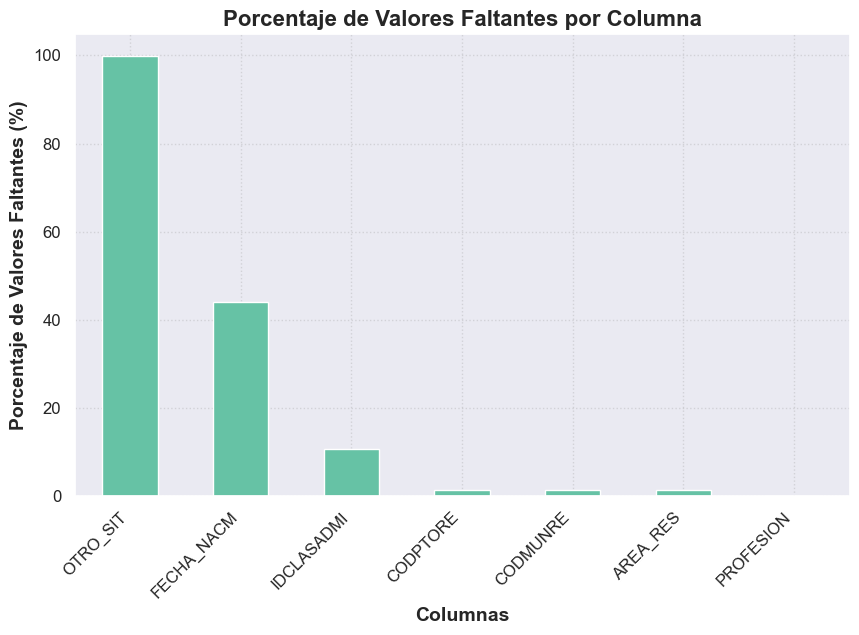

In [39]:
missing_data21 = check_completeness(nac2021_data)

In [40]:
duplicate_info21 = check_uniqueness(nac2021_data)

Unicidad: Detección de Duplicados
Número de duplicados: 698
Porcentaje de duplicados: 0.11%

Registros duplicados (primeras 5 filas):
      COD_DPTO  COD_MUNIC  AREANAC  SIT_PARTO OTRO_SIT  SEXO  PESO_NAC  \
279         44        847        3          2      NaN     1         9   
280         44        847        3          2      NaN     2         9   
281         44        847        3          2      NaN     2         9   
1261        44          1        1          1      NaN     1         4   
1317        44        430        3          2      NaN     1         9   

      TALLA_NAC   ANO  MES  ...  N_HIJOSV  FECHA_NACM  N_EMB  SEG_SOCIAL  \
279           9  2021   10  ...         1         NaN      1           2   
280           9  2021   11  ...         1         NaN      1           2   
281           9  2021   10  ...         1         NaN      1           2   
1261          4  2021    4  ...         2         NaN      1           1   
1317          9  2021    6  ...         1

In [41]:
validity_issues21 = check_validity_auto(nac2021_data)

COD_MUNIC - Valores fuera de rango detectados: 46180
Rango válido detectado: (-432.5, 723.5)
Valores fuera de rango: [758 770 847 820 742 823 780 744 832 836 980 849 894 873 855 810 771 798
 750 760 787 745 838 960 874 756 843 754 763 822 839 799 862 872 801 753
 867 817 835 899 861 776 785 885 791 797 898 807 871 793 759 740 814 842
 736 772 757 755 773 815 875 860 878 845 841 743 804 816 886 888 887 889
 895 777 800 794 883 884 834 809 786 821 892 865 869 828 788 863 890 824
 854 870 877 761 837 792 858 819 789 856 790 893]

AREANAC - Valores fuera de rango detectados: 16960
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [2 3]

SIT_PARTO - Valores fuera de rango detectados: 16747
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [2 3]

PESO_NAC - Valores fuera de rango detectados: 41526
Rango válido detectado: (3.5, 7.5)
Valores fuera de rango: [8 3 9 2 1]

TALLA_NAC - Valores fuera de rango detectados: 8356
Rango válido detectado: (2.5, 6.5)
Valores fuera de ran

In [42]:
incosistences21 = check_consistency(nac2021_data)

Todos los tipos de datos son consistentes con los esperados.


C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\604307692.py:92: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(dataset[col]):


## Nacimientos año 2022

In [43]:
nac2022_data.shape

(573625, 39)

In [44]:
nac2022_data.head()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,...,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
0,8,638,1,1,NaN,1,4,4,2022,12,...,2,12/10/2015,2,2,2.0,29,3,8,1.0,1
1,11,1,1,1,NaN,1,6,5,2022,12,...,2,12/09/2012,2,1,1.0,24,4,11,1.0,1
2,27,1,1,1,NaN,2,6,5,2022,12,...,4,14/03/2019,4,2,2.0,25,3,9,1.0,1
3,8,1,1,1,NaN,1,7,5,2022,12,...,2,21/09/2017,4,1,1.0,29,8,2,1.0,1
4,76,1,1,1,NaN,2,4,4,2022,12,...,1,NaN,1,2,2.0,21,2,5,1.0,1


In [45]:
nac2022_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 573625 entries, 0 to 573624
Data columns (total 39 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   COD_DPTO        573625 non-null  int64  
 1   COD_MUNIC       573625 non-null  int64  
 2   AREANAC         573625 non-null  int64  
 3   SIT_PARTO       573625 non-null  int64  
 4   OTRO_SIT        1153 non-null    object 
 5   SEXO            573625 non-null  int64  
 6   PESO_NAC        573625 non-null  int64  
 7   TALLA_NAC       573625 non-null  int64  
 8   ANO             573625 non-null  int64  
 9   MES             573625 non-null  int64  
 10  ATEN_PAR        573625 non-null  int64  
 11  T_GES           573625 non-null  int64  
 12  T_GES_AGRU_CIE  573625 non-null  int64  
 13  NUMCONSUL       573625 non-null  int64  
 14  TIPO_PARTO      573625 non-null  int64  
 15  MUL_PARTO       573625 non-null  int64  
 16  APGAR1          573625 non-null  int64  
 17  APGAR2    

In [46]:
nac2022_data.describe()

,COD_DPTO,COD_MUNIC,AREANAC,SIT_PARTO,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION,TIPOFORMULARIO
count,573625.000000,573625.000000,573625.000000,573625.000000,573625.000000,573625.000000,573625.000000,573625.0,573625.000000,573625.000000,...,567227.000000,573625.000000,573625.000000,573625.000000,532880.000000,573625.000000,573625.000000,573625.000000,571426.000000,573625.000000
mean,34.287707,161.673253,1.059858,1.048894,1.489131,5.674010,4.580214,2022.0,6.529705,1.101352,...,1.426665,2.306800,2.490333,1.894248,1.686243,36.490922,13.588456,16.155612,1.026394,1.007465
std,26.608224,260.008908,0.533592,0.503851,0.500039,1.100214,0.687949,0.0,3.444938,0.729567,...,0.773958,6.127059,6.148717,1.091143,0.790525,78.459605,27.612422,26.914807,0.300867,0.121127
min,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2022.0,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,12.000000,1.000000,0.000000,1.000000,1.000000
25%,11.000000,1.000000,1.000000,1.000000,1.000000,5.000000,4.000000,2022.0,4.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,24.000000,3.000000,5.000000,1.000000,1.000000
50%,23.000000,1.000000,1.000000,1.000000,1.000000,6.000000,5.000000,2022.0,7.000000,1.000000,...,1.000000,2.000000,2.000000,2.000000,2.000000,29.000000,4.000000,9.000000,1.000000,1.000000
75%,54.000000,269.000000,1.000000,1.000000,2.000000,6.000000,5.000000,2022.0,10.000000,1.000000,...,1.000000,2.000000,3.000000,2.000000,2.000000,35.000000,8.000000,11.000000,1.000000,1.000000
max,99.000000,980.000000,9.000000,9.000000,3.000000,9.000000,9.000000,2022.0,12.000000,9.000000,...,3.000000,99.000000,99.000000,9.000000,9.000000,999.000000,99.000000,99.000000,5.000000,3.000000


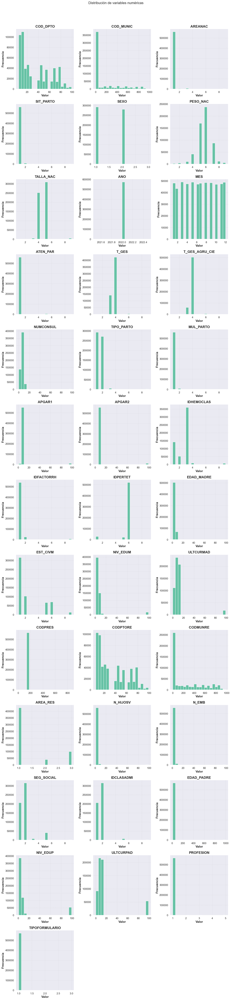

In [47]:
plot_numeric_distributions(nac2022_data)

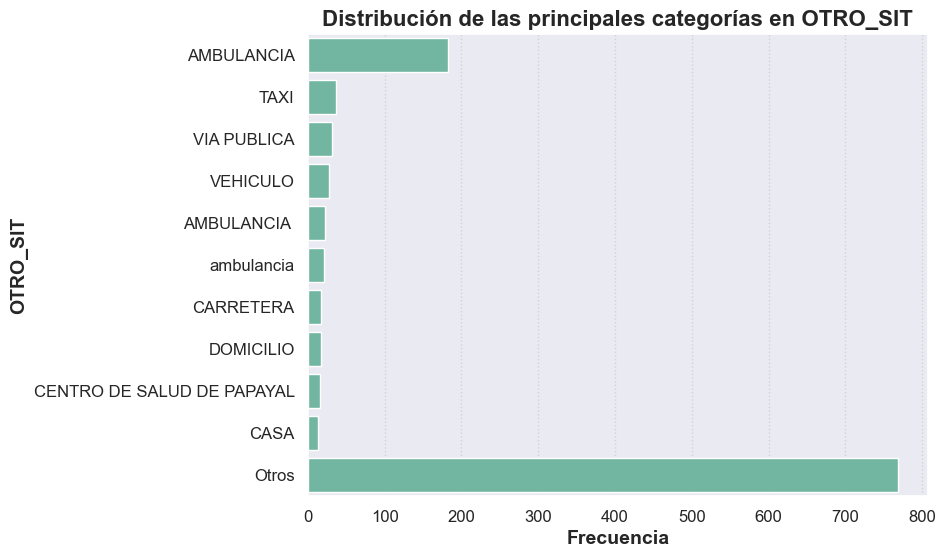

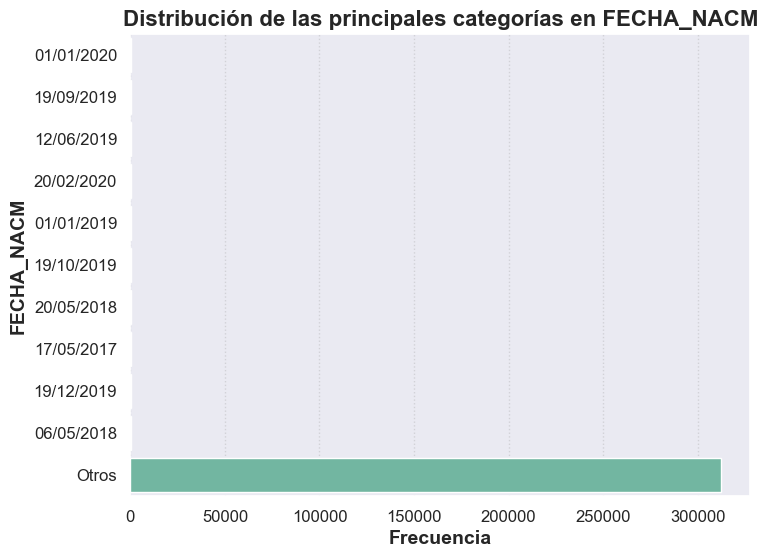

In [48]:
plot_top_categories(nac2022_data, 'OTRO_SIT')
plot_top_categories(nac2022_data, 'FECHA_NACM')

COD_DPTO - Datos atípicos detectados: 0
COD_MUNIC - Datos atípicos detectados: 45950
Valores atípicos: [744 899 861 ... 980 807 758]

AREANAC - Datos atípicos detectados: 12558
Valores atípicos: [2 3 3 ... 2 3 3]

SIT_PARTO - Datos atípicos detectados: 12316
Valores atípicos: [2 2 2 ... 2 2 2]

SEXO - Datos atípicos detectados: 0
PESO_NAC - Datos atípicos detectados: 35369
Valores atípicos: [3 2 9 ... 3 9 3]

TALLA_NAC - Datos atípicos detectados: 6219
Valores atípicos: [9 9 9 ... 2 9 9]

ANO - Datos atípicos detectados: 0
MES - Datos atípicos detectados: 0
ATEN_PAR - Datos atípicos detectados: 12373
Valores atípicos: [5 6 5 ... 6 5 5]

T_GES - Datos atípicos detectados: 5195
Valores atípicos: [6 6 6 ... 6 6 6]

T_GES_AGRU_CIE - Datos atípicos detectados: 68637
Valores atípicos: [3 3 3 ... 3 3 3]

NUMCONSUL - Datos atípicos detectados: 32061
Valores atípicos: [13  0  0 ... 15 13 99]

TIPO_PARTO - Datos atípicos detectados: 2222
Valores atípicos: [9 9 9 ... 4 4 4]

MUL_PARTO - Datos atí

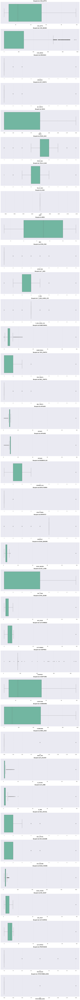

{'COD_DPTO': array([], dtype=int64),
 'COD_MUNIC': array([744, 899, 861, ..., 980, 807, 758], dtype=int64),
 'AREANAC': array([2, 3, 3, ..., 2, 3, 3], dtype=int64),
 'SIT_PARTO': array([2, 2, 2, ..., 2, 2, 2], dtype=int64),
 'SEXO': array([], dtype=int64),
 'PESO_NAC': array([3, 2, 9, ..., 3, 9, 3], dtype=int64),
 'TALLA_NAC': array([9, 9, 9, ..., 2, 9, 9], dtype=int64),
 'ANO': array([], dtype=int64),
 'MES': array([], dtype=int64),
 'ATEN_PAR': array([5, 6, 5, ..., 6, 5, 5], dtype=int64),
 'T_GES': array([6, 6, 6, ..., 6, 6, 6], dtype=int64),
 'T_GES_AGRU_CIE': array([3, 3, 3, ..., 3, 3, 3], dtype=int64),
 'NUMCONSUL': array([13,  0,  0, ..., 15, 13, 99], dtype=int64),
 'TIPO_PARTO': array([9, 9, 9, ..., 4, 4, 4], dtype=int64),
 'MUL_PARTO': array([2, 2, 2, ..., 2, 2, 2], dtype=int64),
 'APGAR1': array([99, 99,  5, ...,  6, 99,  5], dtype=int64),
 'APGAR2': array([99, 99,  5, ..., 99, 99, 99], dtype=int64),
 'IDHEMOCLAS': array([9, 9, 9, ..., 9, 9, 9], dtype=int64),
 'IDFACTORRH': ar

In [49]:
plot_boxplots_and_detect_outliers(nac2022_data)

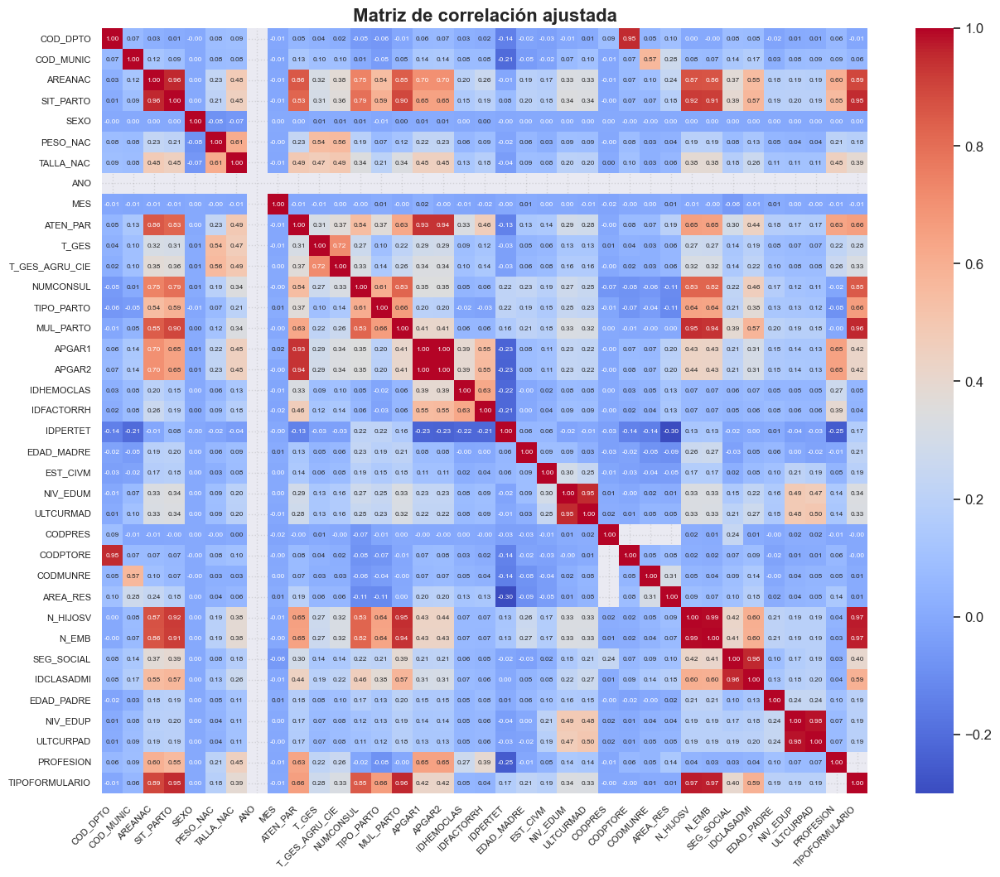

In [50]:
plot_correlation_matrix(nac2022_data)

Análisis de cálidad de los datos.

Completitud: Valores Faltantes
            Valores faltantes  Porcentaje (%)
OTRO_SIT               572472       99.798998
FECHA_NACM             259405       45.222053
IDCLASADMI              40745        7.103073
CODPTORE                 6398        1.115363
CODMUNRE                 6398        1.115363
AREA_RES                 6398        1.115363
PROFESION                2199        0.383351
CODPRES                  2085        0.363478


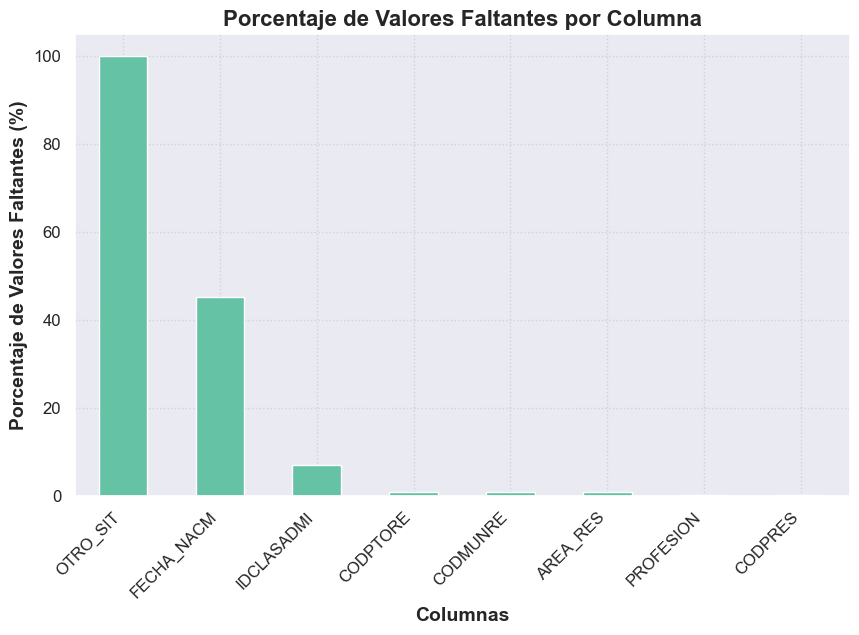

In [51]:
missing_data22 = check_completeness(nac2022_data)

In [52]:
duplicate_info22 = check_uniqueness(nac2022_data)

Unicidad: Detección de Duplicados
Número de duplicados: 584
Porcentaje de duplicados: 0.10%

Registros duplicados (primeras 5 filas):
     COD_DPTO  COD_MUNIC  AREANAC  SIT_PARTO OTRO_SIT  SEXO  PESO_NAC  \
380        54          1        1          1      NaN     2         4   
441        20         45        9          9      NaN     2         9   
445        44        560        9          9      NaN     2         9   
457        44        847        9          9      NaN     2         9   
499        20        570        9          9      NaN     1         9   

     TALLA_NAC   ANO  MES  ...  N_HIJOSV  FECHA_NACM  N_EMB  SEG_SOCIAL  \
380          4  2022   12  ...         2         NaN      2           1   
441          9  2022    9  ...        99         NaN     99           9   
445          9  2022    6  ...        99         NaN     99           9   
457          9  2022    6  ...        99         NaN     99           9   
499          9  2022    4  ...        99         NaN

In [53]:
validity_issues22 = check_validity_auto(nac2022_data)

COD_MUNIC - Valores fuera de rango detectados: 45950
Rango válido detectado: (-401.0, 671.0)
Valores fuera de rango: [744 899 861 679 847 773 736 755 708 835 698 892 838 834 758 837 887 873
 794 790 807 753 890 757 865 754 770 780 759 756 675 810 789 895 842 800
 960 689 801 820 798 814 884 787 889 687 743 980 678 843 815 875 885 682
 720 821 713 711 855 696 693 817 745 809 676 883 824 869 710 701 893 823
 785 688 686 819 791 874 690 707 878 845 761 777 672 854 750 717 871 792
 683 877 692 870 799 772 680 718 673 771 858 863 760 894 836 697 828 685
 856 808 867 740 872 674 702 797 786 742 849 816 862 886 699 860 839 684
 804 879 763 832]

AREANAC - Valores fuera de rango detectados: 12558
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [2 3 9]

SIT_PARTO - Valores fuera de rango detectados: 12316
Rango válido detectado: (1.0, 1.0)
Valores fuera de rango: [2 9 3]

PESO_NAC - Valores fuera de rango detectados: 35369
Rango válido detectado: (3.5, 7.5)
Valores fuera de rango: [3

In [54]:
incosistences22 = check_consistency(nac2022_data)

Todos los tipos de datos son consistentes con los esperados.


C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\604307692.py:92: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(dataset[col]):


# Pre limpieza conjunta. 

Copiamos el dataset original.

In [55]:
n2017 = nac2017_data.copy()
n2018 = nac2018_data.copy()
n2021 = nac2021_data.copy()
n2022 = nac2022_data.copy()

Eliminación de duplicados. 

In [56]:
#Eliminar duplicados
n2017.drop_duplicates(inplace=True)
n2018.drop_duplicates(inplace=True)
n2021.drop_duplicates(inplace=True)
n2022.drop_duplicates(inplace=True)

Eliminación de la columna TIPOFORMULARIO de los datasets 2021 2022

In [57]:
# Eliminamos la columna TIPOFORMULARIO de n2021 y n2022
n2021.drop(columns=['TIPOFORMULARIO'], inplace=True)
n2022.drop(columns=['TIPOFORMULARIO'], inplace=True)

Corrección de tipos. 

In [58]:
# Crear la columna combinada de departamento y municipio en la tabla de referencia
ciudades_cod['CODIGO_DPTO_MUNICIPIO'] = (
    ciudades_cod['Código Departamento'].astype(str).str.zfill(2) + 
    ciudades_cod['Código Municipio'].astype(str).str.zfill(3)
)

In [ ]:
# Lista de DataFrames a los que se desea aplicar la conversión
datasets = [n2017, n2018, n2021, n2022]

# Convertir columnas a `Int64` en cada DataFrame
for df in datasets:
    df['SEXO'] = df['SEXO'].astype('Int64')
    df['PESO_NAC'] = df['PESO_NAC'].astype('Int64')
    df['TALLA_NAC'] = df['TALLA_NAC'].astype('Int64')
    df['ATEN_PAR'] = df['ATEN_PAR'].astype('Int64')
    df['T_GES'] = df['T_GES'].astype('Int64')
    # Crear la columna combinada en cada dataset de trabajo
    df['CODIGO_DPTO_MUNICIPIO'] = (
        df['COD_DPTO'].astype(str).str.zfill(2) + 
        df['COD_MUNIC'].astype(str).str.zfill(3)
    )
    # Convertir la columna FECHA_NACM a datetime, si aún no se ha hecho
    df['FECHA_NACM'] = pd.to_datetime(df['FECHA_NACM'], errors='coerce')

    # Crear la columna ES_PRIMER_NACIMIENTO: 1 si FECHA_NACM es NaN, 0 en caso contrario
    df['ES_PRIMER_NACIMIENTO'] = df['FECHA_NACM'].isna().astype(int)

    # Rellenar los NaN en FECHA_NACM con un valor indicativo de que no hay hijo anterior
    df['FECHA_NACM'].fillna('Sin hijo anterior', inplace=True)

C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\171915299.py:17: UserWarning: Parsing dates in %d/%m/%Y format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['FECHA_NACM'] = pd.to_datetime(df['FECHA_NACM'], errors='coerce')
C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\171915299.py:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['FECHA_NACM'].fillna('Sin hijo anterior', inplace=True)
C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\171915299.py:23: Fut

In [ ]:
# Diccionario de mapeo de códigos de departamento/municipio a nombres
deptos_map = dict(zip(ciudades_cod['Código Departamento'], ciudades_cod['Nombre Departamento']))
# Crear el diccionario de mapeo para la combinación única
municipios_map = dict(zip(ciudades_cod['CODIGO_DPTO_MUNICIPIO'], ciudades_cod['Nombre Municipio']))

# Diccionario de mapeo para el tipo de área
areanac_map = {
    1: 'Cabecera municipal',
    2: 'Centro poblado (Inspección, corregimiento o caserío)',
    3: 'Rural disperso',
    9: 'Sin información'
}

# Diccionario de mapeo para el sitio del parto
sitio_parto_map = {
    1: 'Institución de salud',
    2: 'Domicilio',
    3: 'Otro',
    9: 'Sin información'
}

# Diccionario de mapeo para reducir las categorías de OTRO_SIT
otro_sit_map = {
    # Instituciones de Salud
    'HOSPITAL': 'Instituciones de Salud', 'CLINICA': 'Instituciones de Salud', 'PUESTO DE SALUD': 'Instituciones de Salud',
    'CENTRO DE SALUD': 'Instituciones de Salud', 'CONSULTORIO': 'Instituciones de Salud', 'ESE': 'Instituciones de Salud',

    # Ambulancia o Traslado
    'AMBULANCIA': 'Ambulancia o Traslado', 'TRASLADO': 'Ambulancia o Traslado', 'CARRETERA': 'Ambulancia o Traslado',
    'VEHICULO': 'Ambulancia o Traslado', 'TRANSPORTE': 'Ambulancia o Traslado', 'CAMINO': 'Ambulancia o Traslado',

    # Domicilio
    'CASA': 'Domicilio', 'DOMICILIO': 'Domicilio', 'HOGAR': 'Domicilio', 'FINCA': 'Domicilio', 'RESIDENCIA': 'Domicilio',

    # Vía Pública
    'VIA PUBLICA': 'Vía Pública', 'CALLE': 'Vía Pública', 'TAXI': 'Vía Pública', 'VEHÍCULO PUBLICO': 'Vía Pública',
    'CARRO': 'Vía Pública', 'PATRULLA': 'Vía Pública', 'AUTOMOVIL': 'Vía Pública',

    # Transporte Acuático
    'RIO': 'Transporte Acuático', 'BOTE': 'Transporte Acuático', 'LANCHA': 'Transporte Acuático', 'CANOA': 'Transporte Acuático',
    'TRANSPORTE FLUVIAL': 'Transporte Acuático', 'TRANSPORTE ACUATICO': 'Transporte Acuático',

    # Comunidades Indígenas o Rurales
    'VEREDA': 'Comunidades Indígenas o Rurales', 'COMUNIDAD': 'Comunidades Indígenas o Rurales',
    'RANCHERIA': 'Comunidades Indígenas o Rurales', 'RESGUARDO': 'Comunidades Indígenas o Rurales',

    # Otro
    'HOTEL': 'Otro', 'TRABAJO': 'Otro', 'CAMPO': 'Otro', 'SIN INFORMACIÓN': 'Otro', 'DESCONOCIDO': 'Otro', 
    
    # No aplica
}

# Función para asignar las categorías generales
def map_otro_sit(value):
    # Convertir el valor a cadena para asegurar que tiene el método upper()
    value_str = str(value)
    # Buscar si la palabra clave está en el valor
    for key, category in otro_sit_map.items():
        if key in value_str.upper():  # Convertir a mayúsculas para asegurar coincidencia
            return category
    return 'Otro'  # Si no coincide con ninguna categoría, asignar "Otro"

# Diccionario de mapeo para el sexo del recién nacido
sexo_map = {
    1: 'M',
    2: 'F',
    9: 'Sin información'
}

# Diccionario para el límite inferior de cada rango de peso
peso_nacido_lim_inferior = {
    1: 0,       # Menos de 1.000
    2: 1000,    # 1.000 - 1.499
    3: 1500,    # 1.500 - 1.999
    4: 2000,    # 2.000 - 2.499
    5: 2500,    # 2.500 - 2.999
    6: 3000,    # 3.000 - 3.499
    7: 3500,    # 3.500 - 3.999
    8: 4000,    # 4.000 y más
    9: None     # Sin información
}

# Diccionario para el límite superior de cada rango de peso
peso_nacido_lim_superior = {
    1: 999,     # Menos de 1.000
    2: 1499,    # 1.000 - 1.499
    3: 1999,    # 1.500 - 1.999
    4: 2499,    # 2.000 - 2.499
    5: 2999,    # 2.500 - 2.999
    6: 3499,    # 3.000 - 3.499
    7: 3999,    # 3.500 - 3.999
    8: 4000,    # Sin límite superior (4.000 y más)
    9: None     # Sin información
}


# Diccionario para el límite inferior de cada rango de talla
talla_nacido_lim_inferior = {
    1: 0,      # Menos de 20
    2: 20,     # 20-29
    3: 30,     # 30-39
    4: 40,     # 40-49
    5: 50,     # 50-59
    6: 60,     # 60 y más (valor mínimo)
    9: None    # Sin información
}

# Diccionario para el límite superior de cada rango de talla
talla_nacido_lim_superior = {
    1: 19,     # Menos de 20
    2: 29,     # 20-29
    3: 39,     # 30-39
    4: 49,     # 40-49
    5: 59,     # 50-59
    6: 60,   # No tiene límite superior (60 y más)
    9: None    # Sin información
}


# Diccionario de mapeo para el tipo de persona que atendió el parto (ATEN_PAR)
atencion_parto_map = {
    1: 'Médico',
    2: 'Enfermero(a)',
    3: 'Auxiliar de enfermería',
    4: 'Promotor(a) de salud',
    5: 'Partera',
    6: 'Otra persona',
    9: 'Sin información'
}

# Diccionario para el límite inferior de cada rango de gestación
gestacion_lim_inferior = {
    1: 0,      # Menos de 22 semanas
    2: 22,     # De 22 a 27 semanas
    3: 28,     # De 28 a 37 semanas
    4: 38,     # De 38 a 41 semanas
    5: 42,     # 42 semanas y más (mínimo de 42)
    6: None,   # Ignorado
    9: None    # Sin información
}

# Diccionario para el límite superior de cada rango de gestación
gestacion_lim_superior = {
    1: 21,     # Menos de 22 semanas
    2: 27,     # De 22 a 27 semanas
    3: 37,     # De 28 a 37 semanas
    4: 41,     # De 38 a 41 semanas
    5: 42,     # No tiene límite superior (42 semanas y más)
    6: None,   # Ignorado
    9: None    # Sin información
}

# Pasar de 99 a 0 en NUMCONSUL

# Diccionario de mapeo para la columna TIPO_PARTO
tipo_parto_map = {
    1: 'Espontáneo',
    2: 'Cesárea',
    3: 'Instrumentado',
    4: 'Ignorado',
    9: 'Sin información'
}

# Diccionario para el grupo sanguíneo
grupo_sanguineo_map = {
    1: 'A',
    2: 'B',
    3: 'O',
    4: 'AB',
    9: 'Sin información'
}

# Diccionario para el factor RH
factor_rh_map = {
    1: 'Positivo',
    2: 'Negativo',
    9: 'Sin información'
}

def combinar_hemoclasificacion(grupo, rh):
    # Obtener el grupo sanguíneo y el factor RH a partir de los diccionarios
    grupo_sangre = grupo_sanguineo_map.get(grupo, 'Sin información')
    factor_rh = factor_rh_map.get(rh, 'Sin información')
    
    # Si alguno de los dos es "Sin información", retornar solo "Sin información"
    if grupo_sangre == 'Sin información' or factor_rh == 'Sin información':
        return 'Sin información'
    else:
        return f'{grupo_sangre} {factor_rh}'

# Diccionario de mapeo para la columna IDPERTET
idpertet_map = {
    1: 'Indígena',
    2: 'Rom (Gitano)',
    3: 'Raizal (SAN y PVA)',
    4: 'Palenquero de San Basilio',
    5: 'Negro(a), mulato(a), afrocolombiano(a) o afrodescendiente',
    6: 'Ninguna de las anteriores',
    9: 'Sin información'
}

# Diccionario de mapeo para la columna EDAD_MADRE utilizando el promedio de los rangos de edad
edad_madre_map = {
    1: 12,  # Promedio de 10-14 años
    2: 17,  # Promedio de 15-19 años
    3: 22,  # Promedio de 20-24 años
    4: 27,  # Promedio de 25-29 años
    5: 32,  # Promedio de 30-34 años
    6: 37,  # Promedio de 35-39 años
    7: 42,  # Promedio de 40-44 años
    8: 47,  # Promedio de 45-49 años
    9: 52,  # Promedio de 50-54 años
    99: None  # Sin información
}

# Diccionario de mapeo para el estado conyugal de la madre
estado_conyugal_map = {
    1: 'Unión libre (≥ 2 años)',
    2: 'Unión libre (< 2 años)',
    3: 'Separada/Divorciada',
    4: 'Viuda',
    5: 'Soltera',
    6: 'Casada',
    9: 'Sin información'
}

# Diccionario de mapeo para el nivel educativo de la madre
nivel_educativo_map = {
    1: 'Preescolar',
    2: 'Básica primaria',
    3: 'Básica secundaria',
    4: 'Media académica',
    5: 'Media técnica',
    6: 'Normalista',
    7: 'Técnica profesional',
    8: 'Tecnológica',
    9: 'Profesional',
    10: 'Especialización',
    11: 'Maestría',
    12: 'Doctorado',
    13: 'Ninguno',
    99: 'Sin información'
}

# Diccionario de mapeo para los códigos de país en la columna CODPRES con códigos de tres letras
codpres_map = {
    170: 'COL',   # Colombia
    76: 'BRA',    # Brasil
    174: 'COM',   # Comoras
    862: 'VEN',   # Venezuela
    533: 'ABW',   # Aruba
    528: 'NLD',   # Países Bajos
    152: 'CHL',   # Chile
    604: 'PER',   # Perú
    591: 'PAN',   # Panamá
    218: 'ECU',   # Ecuador
    840: 'USA',   # Estados Unidos
    530: 'ANT',   # Antillas Neerlandesas (disuelto en 2010)
    124: 'CAN',   # Canadá
    891: 'YUG',   # Yugoslavia (disuelto)
    643: 'RUS',   # Rusia
    548: 'VUT',   # Vanuatu
    250: 'FRA',   # Francia
    704: 'VNM',   # Vietnam
    724: 'ESP',   # España
    634: 'QAT',   # Catar
    484: 'MEX',   # México
    384: 'CIV',   # Costa de Marfil
    340: 'HND',   # Honduras
    44: 'BHS',    # Bahamas
    222: 'SLV',   # El Salvador
    388: 'JAM',   # Jamaica
    780: 'TTO'    # Trinidad y Tobago
}

# Aplicar a CODMUNRE y CODPTORE y AREA_RES dptos_map y areanac_map
# Crear una columna ES_PRIMER_NACIMIENTO para marcar los primeros nacimientos y reemplazar los valores NaN en FECHA_NACM con un texto ('Sin hijo anterior'

# Diccionario de mapeo para la columna de Régimen de seguridad social en salud de la madre
regimen_seguridad_social_map = {
    1: 'Contributivo',
    2: 'Subsidiado',
    3: 'Excepción',
    4: 'Especial',
    5: 'No asegurado',
    9: 'Sin información'
}

# Diccionario de mapeo con siglas para la columna IDCLASADMI
idclasadmi_map = {
    1: 'EPS',     # Entidad promotora de salud
    2: 'EPS-S',   # Entidad promotora de salud - Subsidiado
    3: 'EAS',     # Entidad adaptada de salud
    4: 'EES',     # Entidad especial de salud
    5: 'EXS',     # Entidad exceptuada de salud
    9: 'Sin información'      # Sin información
}

# Diccionario de mapeo para la profesión de quien certifica el nacimiento
profesion_certificador_map = {
    1: 'Médico',
    2: 'Enfermero(a)',
    3: 'Auxiliar de enfermería',
    4: 'Promotor(a) de salud',
    5: 'Funcionario de registro civil',
    9: 'Sin información'
}

In [61]:
# Aplicamos la correción de tipos.

# Aplicar el mapeo en cada DataFrame
for df in [n2017, n2018, n2021, n2022]:
    df['DEPARTAMENTO'] = df['COD_DPTO'].map(deptos_map)
    df['MUNICIPIO'] = df['CODIGO_DPTO_MUNICIPIO'].map(municipios_map)
    df['AREANAC'] = df['AREANAC'].map(areanac_map)
    df['SIT_PARTO'] = df['SIT_PARTO'].map(sitio_parto_map)
    df['OTRO_SIT'] = df['OTRO_SIT'].apply(map_otro_sit)
    df['SEXO'] = df['SEXO'].map(sexo_map)
    df['PESO_NAC_MIN'] = df['PESO_NAC'].map(peso_nacido_lim_inferior)
    df['PESO_NAC_MAX'] = df['PESO_NAC'].map(peso_nacido_lim_superior)
    df['TALLA_NAC_MIN'] = df['TALLA_NAC'].map(talla_nacido_lim_inferior)
    df['TALLA_NAC_MAX'] = df['TALLA_NAC'].map(talla_nacido_lim_superior)
    df['ATEN_PAR'] = df['ATEN_PAR'].map(atencion_parto_map)
    df['GESTACION_MIN'] = df['T_GES'].map(gestacion_lim_inferior)
    df['GESTACION_MAX'] = df['T_GES'].map(gestacion_lim_superior)
    df['TIPO_PARTO'] = df['TIPO_PARTO'].map(tipo_parto_map)
    df['HEMOCLASIFICACION'] = df.apply(lambda row: combinar_hemoclasificacion(row['IDHEMOCLAS'], row['IDFACTORRH']), axis=1)
    df['IDPERTET'] = df['IDPERTET'].map(idpertet_map)
    df['EDAD_MADRE'] = df['EDAD_MADRE'].map(edad_madre_map)
    df['EST_CIVM'] = df['EST_CIVM'].map(estado_conyugal_map)
    df['NIV_EDUM'] = df['NIV_EDUM'].map(nivel_educativo_map)
    df['CODPRES'] = df['CODPRES'].map(codpres_map)
    df['CODPTORE'] = df['CODPTORE'].map(deptos_map)
    df['CODMUNRE'] = df['CODIGO_DPTO_MUNICIPIO'].map(municipios_map)
    df['AREA_RES'] = df['AREA_RES'].map(areanac_map)  
    df['SEG_SOCIAL'] = df['SEG_SOCIAL'].map(regimen_seguridad_social_map)
    df['IDCLASADMI'] = df['IDCLASADMI'].map(idclasadmi_map)
    df['NIV_EDUP'] = df['NIV_EDUP'].map(nivel_educativo_map)
    df['PROFESION'] = df['PROFESION'].map(profesion_certificador_map)

In [62]:
# Eliminamos la columna de códigos de departamento y municipio
for df in [n2017, n2018, n2021, n2022]:
    df.drop(columns=['CODIGO_DPTO_MUNICIPIO'], inplace=True)
    # Eliminamos PESO_NAC y TALLA_NAC T_GES_AGRU_CIE
    df.drop(columns=['PESO_NAC', 'TALLA_NAC', 'T_GES_AGRU_CIE', 'T_GES'], inplace=True)

# Limpieza de datos dataset final. 

Concatenar datasets

In [76]:
# Lista de DataFrames
datasets = [n2017, n2018, n2021, n2022]

# Combinar los DataFrames en uno solo
nacColombia = pd.concat(datasets, axis=0, ignore_index=True)

In [77]:
nacColombia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2491743 entries, 0 to 2491742
Data columns (total 44 columns):
 #   Column                Dtype  
---  ------                -----  
 0   COD_DPTO              int64  
 1   COD_MUNIC             int64  
 2   AREANAC               object 
 3   SIT_PARTO             object 
 4   OTRO_SIT              object 
 5   SEXO                  object 
 6   ANO                   int64  
 7   MES                   int64  
 8   ATEN_PAR              object 
 9   NUMCONSUL             int64  
 10  TIPO_PARTO            object 
 11  MUL_PARTO             int64  
 12  APGAR1                int64  
 13  APGAR2                int64  
 14  IDHEMOCLAS            int64  
 15  IDFACTORRH            int64  
 16  IDPERTET              object 
 17  EDAD_MADRE            float64
 18  EST_CIVM              object 
 19  NIV_EDUM              object 
 20  ULTCURMAD             int64  
 21  CODPRES               object 
 22  CODPTORE              object 
 23  CODMUNR

Enriquecimiento del dataset.

In [78]:
# Función para normalizar columnas de texto
def normalize_columns(df, columns):
    for col in columns:
        df[col] = (df[col]
                   .astype(str)                       # Asegurarse de que los datos sean cadenas
                   .apply(unidecode)                  # Eliminar tildes y acentos
                   .str.replace(r'[.,]', '', regex=True)  # Eliminar comas y puntos
                   .str.lower()                       # Convertir a minúsculas
                   .str.strip()                       # Eliminar espacios en los extremos
                   .str.replace(r'\s+', ' ', regex=True))  # Reemplazar múltiples espacios con uno solo
    return df

Mapeamos con el dataset de condiciones ambientales. 

In [79]:
# Verificar que el DataFrame no sea None después de normalizar
nacColombia = normalize_columns(nacColombia, ['DEPARTAMENTO', 'MUNICIPIO'])
temp_data_df = normalize_columns(temp_data_df, ['departamento', 'municipio'])
pres_data_df = normalize_columns(pres_data_df, ['departamento', 'municipio'])
hum_data_df = normalize_columns(hum_data_df, ['departamento', 'municipio'])

# Función para extraer el año y mes de una columna de fechas
def extract_year_month(df, date_column):
    df[date_column] = pd.to_datetime(df[date_column], errors='coerce')
    df['ANO'] = df[date_column].dt.year
    df['MES'] = df[date_column].dt.month
    return df

# Aplicar la función extract_year_month a cada DataFrame de datos ambientales
temp_data_df = extract_year_month(temp_data_df, 'fechaobservacion')
pres_data_df = extract_year_month(pres_data_df, 'fechaobservacion')
hum_data_df = extract_year_month(hum_data_df, 'fechaobservacion')

# Paso 3: Agregar datos ambientales mensuales por departamento, municipio, año y mes
def aggregate_environmental_data(df, value_column, new_column_name):
    return df.groupby(['departamento', 'municipio', 'ANO', 'MES'])[value_column].mean().reset_index().rename(columns={value_column: new_column_name})

# Calcular los promedios mensuales de temperatura, presión y humedad
temp_agg = aggregate_environmental_data(temp_data_df, 'valorobservado', 'temp_promedio')
pres_agg = aggregate_environmental_data(pres_data_df, 'valorobservado', 'pres_promedio')
hum_agg = aggregate_environmental_data(hum_data_df, 'valorobservado', 'hum_promedio')

# Paso 4: Combinar los datos ambientales agregados en un solo DataFrame
environmental_data = temp_agg.merge(pres_agg, on=['departamento', 'municipio', 'ANO', 'MES'], how='outer')
environmental_data = environmental_data.merge(hum_agg, on=['departamento', 'municipio', 'ANO', 'MES'], how='outer')

# Paso 5: Unir el dataset de nacimientos (nacColombia) con el dataset ambiental (environmental_data)
nacColombia = nacColombia.merge(
    environmental_data, 
    left_on=['DEPARTAMENTO', 'MUNICIPIO', 'ANO', 'MES'], 
    right_on=['departamento', 'municipio', 'ANO', 'MES'], 
    how='left'
)

Mapeamos para añadir las instituciones de salud. 

In [80]:
# Normalizar las columnas relevantes en resHosp
resHosp = normalize_columns(resHosp, ['DepartamentoSedeDesc'])

# Reemplazar "bogota dc" por "bogota" en la columna 'DepartamentoSedeDesc'
resHosp['DepartamentoSedeDesc'] = resHosp['DepartamentoSedeDesc'].replace('bogota dc', 'bogota')

# Filtrar el dataset por NombrePrestador que contenga "hospital" o "IPS"
filtered_resHosp = resHosp[resHosp['NombrePrestador'].str.contains('hospital|IPS', case=False, na=False)]

# Agrupar y contar el número de sedes únicas por departamento
grouped_resHosp = filtered_resHosp.groupby('DepartamentoSedeDesc')['CodigoPrestador'].nunique().reset_index(name='CantidadSedes')

# Crear un diccionario con el conteo de sedes por departamento
resHosp_dict = {
    row['DepartamentoSedeDesc']: row['CantidadSedes']
    for _, row in grouped_resHosp.iterrows()
}

# Aplicar el mapeo para el conteo de sedes por departamento
nacColombia['CantidadSedes'] = nacColombia['DEPARTAMENTO'].map(resHosp_dict).fillna(0).astype(int)

In [81]:
nacColombia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2491743 entries, 0 to 2491742
Data columns (total 50 columns):
 #   Column                Dtype  
---  ------                -----  
 0   COD_DPTO              int64  
 1   COD_MUNIC             int64  
 2   AREANAC               object 
 3   SIT_PARTO             object 
 4   OTRO_SIT              object 
 5   SEXO                  object 
 6   ANO                   int64  
 7   MES                   int64  
 8   ATEN_PAR              object 
 9   NUMCONSUL             int64  
 10  TIPO_PARTO            object 
 11  MUL_PARTO             int64  
 12  APGAR1                int64  
 13  APGAR2                int64  
 14  IDHEMOCLAS            int64  
 15  IDFACTORRH            int64  
 16  IDPERTET              object 
 17  EDAD_MADRE            float64
 18  EST_CIVM              object 
 19  NIV_EDUM              object 
 20  ULTCURMAD             int64  
 21  CODPRES               object 
 22  CODPTORE              object 
 23  CODMUNR

Completitud: Valores Faltantes
               Valores faltantes  Porcentaje (%)
pres_promedio            1578307       63.341484
hum_promedio             1520087       61.004967
temp_promedio            1492136       59.883222
municipio                1474252       59.165492
departamento             1474252       59.165492
IDCLASADMI                160871        6.456163
CODPTORE                   20460        0.821112
AREA_RES                   20283        0.814009
TALLA_NAC_MIN              20064        0.805219
TALLA_NAC_MAX              20064        0.805219
PESO_NAC_MAX               19876        0.797675
PESO_NAC_MIN               19876        0.797675
GESTACION_MIN              19096        0.766371
GESTACION_MAX              19096        0.766371
PROFESION                   2144        0.086044
CODPRES                     2007        0.080546
EDAD_MADRE                   815        0.032708
CODMUNRE                     511        0.020508
SEXO                         263      

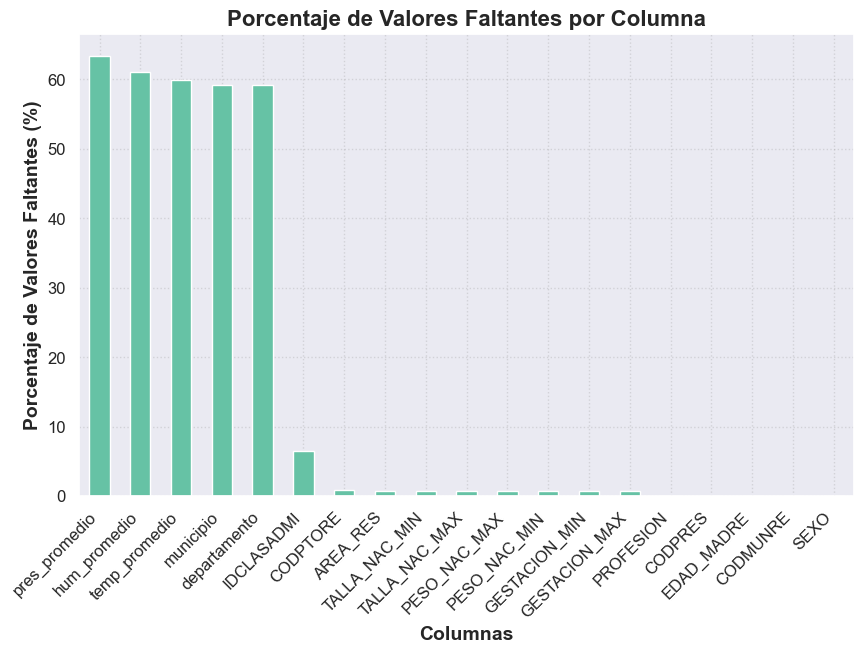

In [82]:
missing = check_completeness(nacColombia)

Organizar columnas

In [83]:
# Actualizar el orden de las columnas
column_order = [
    # Datos de Localización
    'COD_DPTO', 'COD_MUNIC', 'DEPARTAMENTO', 'MUNICIPIO', 'AREA_RES',
    
    # Datos del Nacimiento
    'FECHA_NACM', 'ANO', 'MES', 'SEXO', 'PESO_NAC_MIN', 'PESO_NAC_MAX', 
    'TALLA_NAC_MIN', 'TALLA_NAC_MAX', 'APGAR1', 'APGAR2', 'IDFACTORRH', 'IDHEMOCLAS',
    'MUL_PARTO', 'ES_PRIMER_NACIMIENTO', 'CODPTORE', 'IDPERTET',
    
    # Indicadores de Salud Materna
    'EDAD_MADRE', 'EST_CIVM', 'NIV_EDUM', 'ULTCURMAD', 'SEG_SOCIAL', 'IDCLASADMI',
    
    # Datos de la madre
    'CODMUNRE', 'CODPRES', 'AREANAC', 'N_EMB', 'N_HIJOSV',
    
    # Datos de la Atención Prenatal y Parto
    'NUMCONSUL', 'TIPO_PARTO', 'SIT_PARTO', 'ATEN_PAR', 'PROFESION', 'OTRO_SIT',
    
    # Datos del Padre
    'EDAD_PADRE', 'NIV_EDUP', 'ULTCURPAD',
    
    # Otros Indicadores de Salud
    'GESTACION_MIN', 'GESTACION_MAX', 'HEMOCLASIFICACION',
    
    # Nuevas columnas
    'temp_promedio', 'pres_promedio', 'hum_promedio', 'CantidadSedes'
]

# Definir el mapa de tipos de datos para cada columna
dtype_map = {
    # Datos de Localización
    'COD_DPTO': 'int64', 'COD_MUNIC': 'int64', 'DEPARTAMENTO': 'object', 'MUNICIPIO': 'object', 'AREA_RES': 'object',
    
    # Datos del Nacimiento
    'FECHA_NACM': 'object', 'ANO': 'int64', 'MES': 'int64', 'SEXO': 'object', 
    'PESO_NAC_MIN': 'float64', 'PESO_NAC_MAX': 'float64', 'TALLA_NAC_MIN': 'float64', 'TALLA_NAC_MAX': 'float64',
    'APGAR1': 'int64', 'APGAR2': 'int64', 'IDFACTORRH': 'int64', 'IDHEMOCLAS': 'int64', 
    'MUL_PARTO': 'int64', 'ES_PRIMER_NACIMIENTO': 'int32', 'CODPTORE': 'object', 'IDPERTET': 'object',
    
    # Indicadores de Salud Materna
    'EDAD_MADRE': 'float64', 'EST_CIVM': 'object', 'NIV_EDUM': 'object', 'ULTCURMAD': 'int64', 
    'SEG_SOCIAL': 'object', 'IDCLASADMI': 'object',
    
    # Datos de la madre
    'CODMUNRE': 'object', 'CODPRES': 'object', 'AREANAC': 'object', 'N_EMB': 'int64', 'N_HIJOSV': 'int64',
    
    # Datos de la Atención Prenatal y Parto
    'NUMCONSUL': 'int64', 'TIPO_PARTO': 'object', 'SIT_PARTO': 'object', 'ATEN_PAR': 'object', 
    'PROFESION': 'object', 'OTRO_SIT': 'object',
    
    # Datos del Padre
    'EDAD_PADRE': 'int64', 'NIV_EDUP': 'object', 'ULTCURPAD': 'int64',
    
    # Otros Indicadores de Salud
    'GESTACION_MIN': 'float64', 'GESTACION_MAX': 'float64', 'HEMOCLASIFICACION': 'object',
    
    # Variables ambientales
    'temp_promedio': 'float64', 'pres_promedio': 'float64', 'hum_promedio': 'float64', 'CantidadSedes': 'int64'
}

# Convertir los tipos de datos según el diccionario
for col, dtype in dtype_map.items():
    nacColombia[col] = nacColombia[col].astype(dtype)

# Reorganizar las columnas en el orden especificado
nacColombia = nacColombia[column_order]   

Imputación y eliminación de datos/columnas

In [84]:
nacColombia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2491743 entries, 0 to 2491742
Data columns (total 48 columns):
 #   Column                Dtype  
---  ------                -----  
 0   COD_DPTO              int64  
 1   COD_MUNIC             int64  
 2   DEPARTAMENTO          object 
 3   MUNICIPIO             object 
 4   AREA_RES              object 
 5   FECHA_NACM            object 
 6   ANO                   int64  
 7   MES                   int64  
 8   SEXO                  object 
 9   PESO_NAC_MIN          float64
 10  PESO_NAC_MAX          float64
 11  TALLA_NAC_MIN         float64
 12  TALLA_NAC_MAX         float64
 13  APGAR1                int64  
 14  APGAR2                int64  
 15  IDFACTORRH            int64  
 16  IDHEMOCLAS            int64  
 17  MUL_PARTO             int64  
 18  ES_PRIMER_NACIMIENTO  int32  
 19  CODPTORE              object 
 20  IDPERTET              object 
 21  EDAD_MADRE            float64
 22  EST_CIVM              object 
 23  NIV_EDU

In [86]:
# Imputamos datos con la moda para las columnas especificadas
columns_to_impute = [
    'IDCLASADMI', 'CODPTORE', 'AREA_RES', 'TALLA_NAC_MIN', 'TALLA_NAC_MAX', 
    'PESO_NAC_MIN', 'PESO_NAC_MAX', 'GESTACION_MIN', 'GESTACION_MAX', 
    'PROFESION', 'CODPRES', 'EDAD_MADRE', 
    'CODMUNRE', 'MUNICIPIO', 'SEXO'
]

for column in columns_to_impute:
    mode_value = nacColombia[column].mode()[0]  # Calcula la moda de la columna
    nacColombia[column].fillna(mode_value, inplace=True)  # Imputa los valores faltantes con la moda

# Paso 1: Convertir valores 0 en NaN para facilitar la imputación
columns_with_zeros = ['PESO_NAC_MIN', 'TALLA_NAC_MIN', 'GESTACION_MIN', 'temp_promedio', 'hum_promedio']
nacColombia[columns_with_zeros] = nacColombia[columns_with_zeros].replace(0, np.nan)

# Paso 2: Imputación por mediana de grupo para peso, talla, y gestación
nacColombia['PESO_NAC_MIN'] = nacColombia.groupby(['DEPARTAMENTO', 'MUNICIPIO', 'SEXO'])['PESO_NAC_MIN'].transform(lambda x: x.fillna(x.median()))
nacColombia['TALLA_NAC_MIN'] = nacColombia.groupby(['DEPARTAMENTO', 'MUNICIPIO', 'SEXO'])['TALLA_NAC_MIN'].transform(lambda x: x.fillna(x.median()))
nacColombia['GESTACION_MIN'] = nacColombia.groupby(['DEPARTAMENTO', 'MUNICIPIO', 'SEXO'])['GESTACION_MIN'].transform(lambda x: x.fillna(x.median()))

# Paso 3: Imputación temporal por departamento y municipio para las variables ambientales
nacColombia['pres_promedio'] = nacColombia.groupby(['DEPARTAMENTO', 'MUNICIPIO'])['pres_promedio'].transform(lambda x: x.fillna(x.median()))
nacColombia['hum_promedio'] = nacColombia.groupby(['DEPARTAMENTO', 'MUNICIPIO'])['hum_promedio'].transform(lambda x: x.fillna(x.median()))
nacColombia['temp_promedio'] = nacColombia.groupby(['DEPARTAMENTO', 'MUNICIPIO'])['temp_promedio'].transform(lambda x: x.fillna(x.median()))

# Paso 4: Imputación final con mediana general para variables ambientales y mediana general para peso, talla, y gestación
nacColombia['pres_promedio'].fillna(nacColombia['pres_promedio'].median(), inplace=True)
nacColombia['hum_promedio'].fillna(nacColombia['hum_promedio'].median(), inplace=True)
nacColombia['temp_promedio'].fillna(nacColombia['temp_promedio'].median(), inplace=True)

nacColombia['PESO_NAC_MIN'].fillna(nacColombia['PESO_NAC_MIN'].median(), inplace=True)
nacColombia['TALLA_NAC_MIN'].fillna(nacColombia['TALLA_NAC_MIN'].median(), inplace=True)
nacColombia['GESTACION_MIN'].fillna(nacColombia['GESTACION_MIN'].median(), inplace=True)

C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\147788640.py:11: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  nacColombia[column].fillna(mode_value, inplace=True)  # Imputa los valores faltantes con la moda
C:\Users\PC2\AppData\Local\Temp\ipykernel_7124\147788640.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting

In [2]:
nacColombia.to_csv('./data/nacimientos_colombiaF.csv', index=False)

NameError: name 'nacColombia' is not defined

In [2]:
# Cargamos 
nacimientosColombia = pd.read_csv('./nacimientos_colombiaF_actualizado.csv')

In [6]:
nacimientosColombia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2491743 entries, 0 to 2491742
Data columns (total 48 columns):
 #   Column                Dtype  
---  ------                -----  
 0   COD_DPTO              int64  
 1   COD_MUNIC             int64  
 2   AREANAC               object 
 3   SIT_PARTO             object 
 4   OTRO_SIT              object 
 5   SEXO                  object 
 6   ANO                   int64  
 7   MES                   int64  
 8   ATEN_PAR              object 
 9   NUMCONSUL             int64  
 10  TIPO_PARTO            object 
 11  MUL_PARTO             int64  
 12  APGAR1                int64  
 13  APGAR2                int64  
 14  IDHEMOCLAS            int64  
 15  IDFACTORRH            int64  
 16  IDPERTET              object 
 17  EDAD_MADRE            float64
 18  EST_CIVM              object 
 19  NIV_EDUM              object 
 20  ULTCURMAD             int64  
 21  CODPRES               object 
 22  CODPTORE              object 
 23  CODMUNR

In [ ]:
# Seleccionar columnas numéricas
numeric_cols = nacimientosColombia.select_dtypes(include=['int64', 'float64'])

# Calcular la matriz de correlación
corr_matrix = numeric_cols.corr()

# Mostrar la matriz de correlación
print(corr_matrix)

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

In [10]:
# Seleccionar columnas originales necesarias
cols_interes = ['APGAR1', 'APGAR2', 'TALLA_NAC_MIN', 'TALLA_NAC_MAX', 
                'PESO_NAC_MIN', 'PESO_NAC_MAX', 'SEG_SOCIAL', 'TIPO_PARTO',
                'GESTACION_MAX', 'GESTACION_MIN', 'N_HIJOSV', 'MUL_PARTO', 'EDAD_MADRE', 'SEXO']

df_final = nacimientosColombia[cols_interes].copy()

# Todas las categorizaciones
df_final['APGAR1_CAT'] = (df_final['APGAR1'] >= 7).astype(int)
df_final['APGAR2_CAT'] = (df_final['APGAR2'] >= 7).astype(int)
df_final['TALLA_CAT'] = ((df_final['TALLA_NAC_MIN'] + df_final['TALLA_NAC_MAX'])/2 >= 47).astype(int)
df_final['PESO_CAT'] = ((df_final['PESO_NAC_MIN'] + df_final['PESO_NAC_MAX'])/2 >= 2.4).astype(int)
df_final['HIJOS_CAT'] = (df_final['N_HIJOSV'] == 0).astype(int)
df_final['EDAD_MADRE_CAT'] = (df_final['EDAD_MADRE'] >= 35).astype(int)
df_final['SEG_SOCIAL_CAT'] = df_final['SEG_SOCIAL'].map(
    lambda x: 1 if x in ['No asegurado', 'Excepción', 'Sin información'] else 0)
df_final['TIPO_PARTO_CAT'] = df_final['TIPO_PARTO'].map(
    lambda x: 1 if x == 'Cesárea' else 0)
df_final['GESTACION_CAT'] = ((df_final['GESTACION_MIN'] + df_final['GESTACION_MAX'])/2 <= 37).astype(int)
df_final['MUL_PARTO_CAT'] = (df_final['MUL_PARTO'] > 1).astype(int)
df_final['SEXO_CAT'] = df_final['SEXO'].map( {'M': 0, 'F': 1} ) 
# Mantener solo columnas categorizadas
cols_categoricas = ['APGAR1_CAT', 'APGAR2_CAT', 'TALLA_CAT', 'PESO_CAT', 
                    'HIJOS_CAT', 'EDAD_MADRE_CAT', 'SEG_SOCIAL_CAT', 
                    'TIPO_PARTO_CAT', 'GESTACION_CAT', 'MUL_PARTO_CAT', 'SEXO_CAT']

df_final = df_final[cols_categoricas]

In [11]:
# Mostrar primeras filas
df_final.head()

,APGAR1_CAT,APGAR2_CAT,TALLA_CAT,PESO_CAT,HIJOS_CAT,EDAD_MADRE_CAT,SEG_SOCIAL_CAT,TIPO_PARTO_CAT,GESTACION_CAT,MUL_PARTO_CAT,SEXO_CAT
0,1,1,1,1,0,0,0,0,0,0,1
1,1,1,1,1,0,0,0,1,1,0,0
2,1,1,1,1,0,0,0,0,0,0,0
3,1,1,0,1,0,1,0,0,0,0,1
4,1,1,1,1,0,0,0,0,1,0,0


In [13]:
# Guardar dataset
df_final.to_csv('nacimientos_colombia_categorizado.csv', index=False)

In [18]:
import pandas as pd
import numpy as np

# Cargar dataset
df = pd.read_csv('nacimientos_colombia_categorizado.csv')

# Función modificada para manejar casos faltantes
def mostrar_contingencia(df, var_dep, var_indep):
    # Crear tabla de contingencia
    tabla = pd.crosstab(df[var_dep], df[var_indep], dropna=False)
    
    print(f"\nAnálisis entre {var_dep} y {var_indep}:")
    print("----------------------------------------")
    
    # Obtener valores con manejo de casos faltantes
    try:
        val_00 = tabla.loc[0, 0] if 0 in tabla.index and 0 in tabla.columns else 0
        val_01 = tabla.loc[0, 1] if 0 in tabla.index and 1 in tabla.columns else 0
        val_10 = tabla.loc[1, 0] if 1 in tabla.index and 0 in tabla.columns else 0
        val_11 = tabla.loc[1, 1] if 1 in tabla.index and 1 in tabla.columns else 0
        
        print(f"Cuando {var_dep} = 0 y {var_indep} = 0: {val_00} casos")
        print(f"Cuando {var_dep} = 0 y {var_indep} = 1: {val_01} casos")
        print(f"Cuando {var_dep} = 1 y {var_indep} = 0: {val_10} casos")
        print(f"Cuando {var_dep} = 1 y {var_indep} = 1: {val_11} casos")
    except Exception as e:
        print(f"No se pudieron obtener todos los valores para {var_dep} y {var_indep}")
        print(f"Tabla actual:\n{tabla}")
    
    print("----------------------------------------\n")
    return tabla

# Variables dependientes e independientes
vars_dependientes = ['APGAR1_CAT', 'APGAR2_CAT', 'TALLA_CAT', 'PESO_CAT', 'SEXO_CAT']
vars_independientes = ['HIJOS_CAT', 'EDAD_MADRE_CAT', 'SEG_SOCIAL_CAT', 
                      'TIPO_PARTO_CAT', 'GESTACION_CAT', 'MUL_PARTO_CAT']

# Generar todos los análisis descriptivos
tablas = {}
for var_dep in vars_dependientes:
    for var_indep in vars_independientes:
        tabla = mostrar_contingencia(df, var_dep, var_indep)
        tablas[(var_dep, var_indep)] = tabla


Análisis entre APGAR1_CAT y HIJOS_CAT:
----------------------------------------
Cuando APGAR1_CAT = 0 y HIJOS_CAT = 0: 83251 casos
Cuando APGAR1_CAT = 0 y HIJOS_CAT = 1: 0 casos
Cuando APGAR1_CAT = 1 y HIJOS_CAT = 0: 2408492 casos
Cuando APGAR1_CAT = 1 y HIJOS_CAT = 1: 0 casos
----------------------------------------


Análisis entre APGAR1_CAT y EDAD_MADRE_CAT:
----------------------------------------
Cuando APGAR1_CAT = 0 y EDAD_MADRE_CAT = 0: 73079 casos
Cuando APGAR1_CAT = 0 y EDAD_MADRE_CAT = 1: 10172 casos
Cuando APGAR1_CAT = 1 y EDAD_MADRE_CAT = 0: 2134921 casos
Cuando APGAR1_CAT = 1 y EDAD_MADRE_CAT = 1: 273571 casos
----------------------------------------


Análisis entre APGAR1_CAT y SEG_SOCIAL_CAT:
----------------------------------------
Cuando APGAR1_CAT = 0 y SEG_SOCIAL_CAT = 0: 75320 casos
Cuando APGAR1_CAT = 0 y SEG_SOCIAL_CAT = 1: 7931 casos
Cuando APGAR1_CAT = 1 y SEG_SOCIAL_CAT = 0: 2205257 casos
Cuando APGAR1_CAT = 1 y SEG_SOCIAL_CAT = 1: 203235 casos
------------